# Heart Disease Prediction

In [1]:
# Use for linear algebra
import numpy as np 

# Use for data processing
import pandas as pd 

# Create figure and plot
import matplotlib.pyplot as plt

# Make statistical graphical
import seaborn as sns

# Draw Nice Graph
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from plotly.offline import iplot
import plotly.offline as po

# Load Data Set

In [2]:
df=pd.read_csv("./heart.csv")

In [3]:
# Styled Table in Plotly

fig = go.Figure(data=[go.Table(header=dict(values=list(df.columns), # Header values
                                           line_color='black', # Line Color of header
                                           fill_color='slateblue', # background color of header
                                           align='center', # Align header at center
                                           height=40, # Height of Header
                                           font=dict(color='white', size=12), # Font size & color of header text
                                           ),
                                            cells=dict(values=[
                                                df.age , # Column values
                                                df.sex, 
                                                df.chestpain,
                                                df.restbp, 
                                                df.choles,
                                                df.fastbs,
                                                df.restecg,
                                                df.maxhr,
                                                df.exagina,
                                                df.oldpeak,
                                                df.stslope,
                                                df.target
                                            ],
                                            line_color='darkgrey', # Line color of the cell
                                            fill_color='mintcream', # Color of the cell
                                            align='left'  # Align text to left in cell
                                           )
                               )
                     ]
               )

fig.update_layout(width=1000, height=500)
fig.show()

# Data Analysis (Male: 1, Female: 0; Target (Have Disease): 1, No: 0)

In [4]:
df.head()

,age,sex,chestpain,restbp,choles,fastbs,restecg,maxhr,exagina,oldpeak,stslope,target
0,40,1,1,140,289,0,0,172,0,0.0,0,0
1,37,1,1,130,283,0,1,98,0,0.0,0,0
2,54,1,2,150,195,0,0,122,0,0.0,0,0
3,39,1,2,120,339,0,0,170,0,0.0,0,0
4,45,0,1,130,237,0,0,170,0,0.0,0,0


In [5]:
df.tail()

,age,sex,chestpain,restbp,choles,fastbs,restecg,maxhr,exagina,oldpeak,stslope,target
3926,57,0,0,140,241,0,1,123,1,0.2,1,0
3927,45,1,3,110,264,0,1,132,0,1.2,1,0
3928,68,1,0,144,193,1,1,141,0,3.4,1,0
3929,57,1,0,130,131,0,1,115,1,1.2,1,0
3930,57,0,1,130,236,0,0,174,0,0.0,1,0


In [6]:
# See Data Types and Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3931 entries, 0 to 3930
Data columns (total 12 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   age        3931 non-null   int64  
 1   sex        3931 non-null   int64  
 2   chestpain  3931 non-null   int64  
 3   restbp     3931 non-null   int64  
 4   choles     3931 non-null   int64  
 5   fastbs     3931 non-null   int64  
 6   restecg    3931 non-null   int64  
 7   maxhr      3931 non-null   int64  
 8   exagina    3931 non-null   int64  
 9   oldpeak    3931 non-null   float64
 10  stslope    3931 non-null   int64  
 11  target     3931 non-null   int64  
dtypes: float64(1), int64(11)
memory usage: 368.7 KB


In [7]:
df.describe()

,age,sex,chestpain,restbp,choles,fastbs,restecg,maxhr,exagina,oldpeak,stslope,target
count,3931.000000,3931.000000,3931.000000,3931.000000,3931.000000,3931.000000,3931.000000,3931.000000,3931.000000,3931.000000,3931.000000,3931.000000
mean,54.210125,0.717629,1.366573,131.723734,233.413381,0.172221,0.581023,146.005597,0.352073,1.019639,1.142457,0.524040
std,9.165491,0.450210,1.167495,17.800206,74.711141,0.377620,0.659042,24.301886,0.477677,1.144141,0.711273,0.499485
min,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,60.000000,0.000000,-2.600000,0.000000,0.000000
25%,47.000000,0.000000,0.000000,120.000000,204.000000,0.000000,0.000000,129.000000,0.000000,0.000000,1.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,236.000000,0.000000,0.000000,150.000000,0.000000,0.800000,1.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.000000,0.000000,1.000000,163.000000,1.000000,1.600000,2.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,603.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,1.000000


In [8]:
#See Data Size
df.shape

(3931, 12)

In [9]:
df.columns

Index(['age', 'sex', 'chestpain', 'restbp', 'choles', 'fastbs', 'restecg',
       'maxhr', 'exagina', 'oldpeak', 'stslope', 'target'],
      dtype='object')

In [10]:
df.isna().sum()

age          0
sex          0
chestpain    0
restbp       0
choles       0
fastbs       0
restecg      0
maxhr        0
exagina      0
oldpeak      0
stslope      0
target       0
dtype: int64

In [11]:
df.corr()

,age,sex,chestpain,restbp,choles,fastbs,restecg,maxhr,exagina,oldpeak,stslope,target
age,1.000000,-0.064548,-0.021610,0.269029,0.082893,0.138343,0.008976,-0.372692,0.122293,0.221901,-0.013687,-0.067635
sex,-0.064548,1.000000,0.049812,-0.050824,-0.201108,0.064606,-0.031786,-0.105954,0.159497,0.086496,-0.022148,-0.098801
chestpain,-0.021610,0.049812,1.000000,0.028763,-0.199055,0.111294,0.089206,-0.018305,-0.101901,-0.077434,-0.133072,0.382176
restbp,0.269029,-0.050824,0.028763,1.000000,0.109356,0.141126,-0.022320,-0.063115,0.090267,0.182057,-0.050893,-0.056205
choles,0.082893,-0.201108,-0.199055,0.109356,1.000000,-0.134411,0.007177,0.146207,0.004776,0.065786,0.078464,-0.136984
fastbs,0.138343,0.064606,0.111294,0.141126,-0.134411,1.000000,-0.032056,-0.063130,0.047463,0.012076,-0.032631,0.054266
restecg,0.008976,-0.031786,0.089206,-0.022320,0.007177,-0.032056,1.000000,0.025519,-0.013042,0.013952,0.017168,0.103652
maxhr,-0.372692,-0.105954,-0.018305,-0.063115,0.146207,-0.063130,0.025519,1.000000,-0.381264,-0.277590,0.214082,0.128951
exagina,0.122293,0.159497,-0.101901,0.090267,0.004776,0.047463,-0.013042,-0.381264,1.000000,0.324192,-0.068272,-0.130399
oldpeak,0.221901,0.086496,-0.077434,0.182057,0.065786,0.012076,0.013952,-0.277590,0.324192,1.000000,-0.179380,-0.179773


In [12]:
df.skew()

age         -0.226006
sex         -0.967281
chestpain    0.095095
restbp       0.572349
choles      -0.904242
fastbs       1.736909
restecg      0.700505
maxhr       -0.439520
exagina      0.619674
oldpeak      1.192911
stslope     -0.213008
target      -0.096307
dtype: float64

# Data Visualization

# Gender (Male: 1, Female: 0)

In [80]:
colors = px.colors.cyclical.Twilight

fig = make_subplots(rows=1,subplot_titles=('', ''))
                    
fig.add_trace(go.Bar(y = df['sex'].value_counts().values.tolist(), x = ['Male', 'Female'], 
                      text=df['sex'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

fig.update_yaxes(range=[0,3000])

#Changing plot & figure background 
fig.update_layout(
                    paper_bgcolor= '#FFFDE7',
                    plot_bgcolor= '#FFFDE7',
                    title=dict(text = "Gender Distribution (Male=1, Female=0)",x=0.5,y=0.95),
                    title_font_size=30
                  )
iplot(fig)

# Chest Pain Type (ASY: 3, NAP: 2, ATA: 1, TA: 0)

In [81]:
colors = px.colors.cyclical.Twilight

fig = make_subplots(rows=1,subplot_titles=('',''))

fig.add_trace(go.Bar(y = df['chestpain'].value_counts().values.tolist(), x = ['ASY', 'NAP', 'ATA', 'TA'], 
                      text=df['chestpain'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

fig.update_yaxes(range=[0,1500])

#Changing plot & figure background 
fig.update_layout(
                    paper_bgcolor= '#FFFDE7',
                    plot_bgcolor= '#FFFDE7',
                    title=dict(text = "Chest Pain Type (ASY: 3, NAP: 2, ATA: 1, TA: 0)",x=0.5,y=0.95),
                    title_font_size=30
                  )
iplot(fig)

# Resting ECG (Normal: 0, ST: 1, LVH: 2)

In [15]:
colors = px.colors.cyclical.Twilight

fig = make_subplots(rows=1,subplot_titles=('',''))

fig.add_trace(go.Bar(y = df['restecg'].value_counts().values.tolist(), x = ['Normal', 'ST', 'LVH'], 
                      text=df['restecg'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

fig.update_yaxes(range=[0,700])

#Changing plot & figure background 
fig.update_layout(
                    paper_bgcolor= '#FFFDE7',
                    plot_bgcolor= '#FFFDE7',
                    title=dict(text = "RestingECG Distribution (Normal: 0, ST: 1, LVH: 2)",x=0.5,y=0.95),
                    title_font_size=30
                  )
iplot(fig)

# Fasting Blood Sugar (< 120mg/dl: 0 (NO), > 120mg/dl: 1 (YES))

In [16]:
colors = px.colors.cyclical.Twilight

fig = make_subplots(rows=1,subplot_titles=('',''))
                    
fig.add_trace(go.Bar(y = df['fastbs'].value_counts().values.tolist(), x = ['No', 'Yes'], 
                      text=df['fastbs'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

fig.update_yaxes(range=[0,850])

#Changing plot & figure background 
fig.update_layout(
                    paper_bgcolor= '#FFFDE7',
                    plot_bgcolor= '#FFFDE7',
                    title=dict(text = "FastingBS Distribution",x=0.5,y=0.95),
                    title_font_size=30
                  )
iplot(fig)

# Exercise Angina (NO: 0, YES: 1)

In [17]:
colors = px.colors.cyclical.Twilight

fig = make_subplots(rows=1,subplot_titles=('',''))

fig.add_trace(go.Bar(y = df['exagina'].value_counts().values.tolist(), x = ['No', 'Yes'], 
                      text=df['exagina'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

fig.update_yaxes(range=[0,700])

#Changing plot & figure background 
fig.update_layout(
                    paper_bgcolor= '#FFFDE7',
                    plot_bgcolor= '#FFFDE7',
                    title=dict(text = "ExerciseAngina Distribution (NO: 0, YES: 1)",x=0.5,y=0.95),
                    title_font_size=30
                  )
iplot(fig)

# ST_Slope (UP: 0, FLAT: 1, DOWN: 2)

In [18]:
colors = px.colors.cyclical.Twilight

fig = make_subplots(rows=1,subplot_titles=('',''))

fig.add_trace(go.Bar(y = df['stslope'].value_counts().values.tolist(), x = ['Flat', 'Up', 'Down'], 
                      text=df['stslope'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

fig.update_yaxes(range=[0,550])

#Changing plot & figure background 
fig.update_layout(
                    paper_bgcolor= '#FFFDE7',
                    plot_bgcolor= '#FFFDE7',
                    title=dict(text = "ST_Slope Distribution (UP: 0, FLAT: 1, DOWN: 2)",x=0.5,y=0.95),
                    title_font_size=30
                  )
iplot(fig)

# Heart Disease (No Heart Disease: 0, Have Heart Disease: 1)

In [19]:
colors = px.colors.cyclical.Twilight

fig = make_subplots(rows=1,subplot_titles=('',''))

fig.add_trace(go.Bar(y = df['target'].value_counts().values.tolist(), x = ['Heart Disease', 'No Heart Disease'], 
                      text=df['target'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

fig.update_yaxes(range=[0,600])

#Changing plot & figure background 
fig.update_layout(
                    paper_bgcolor= '#FFFDE7',
                    plot_bgcolor= '#FFFDE7',
                    title=dict(text = "Heart Disease Distribution (Yes: 1, No: 0)",x=0.5,y=0.95),
                    title_font_size=30
                  )
iplot(fig)

# Corr Graph

In [20]:
# Using facet_row and or facet_col arguments to create Sub plots
# Show Sex, Choles, Fastbs, Age

fig = px.scatter(df, 
                 x=df.age, 
                 y=df.choles, 
                 color=df.target, 
                 facet_col=df.fastbs,
                 facet_row=df.sex,
                 color_discrete_map={1: "#FF5722",0: "#7CB342"},
                 width=950, 
                 height=800,
                 title="Heart Disease Data with (Sex, Choles, Fastbs, Age)")

fig.update_layout(
                    plot_bgcolor= "#dcedc1",
                    paper_bgcolor="#FFFDE7",
                 )


fig.show()

#Use this to store image as offline
#po.plot(fig)

In [21]:
#Use for category for below

cat = ['sex', 'chestpain', 'fastbs', 'restecg', 'exagina', 'stslope', 'target']
num = ['age', 'restbp', 'choles', 'maxhr', 'oldpeak']

# Show Heart Disease

Heart Disease with sex, chestpain, fastbs, restecg, exagina, stslope

Target = Heart Disease (Don't Have: 0, Have: 1)

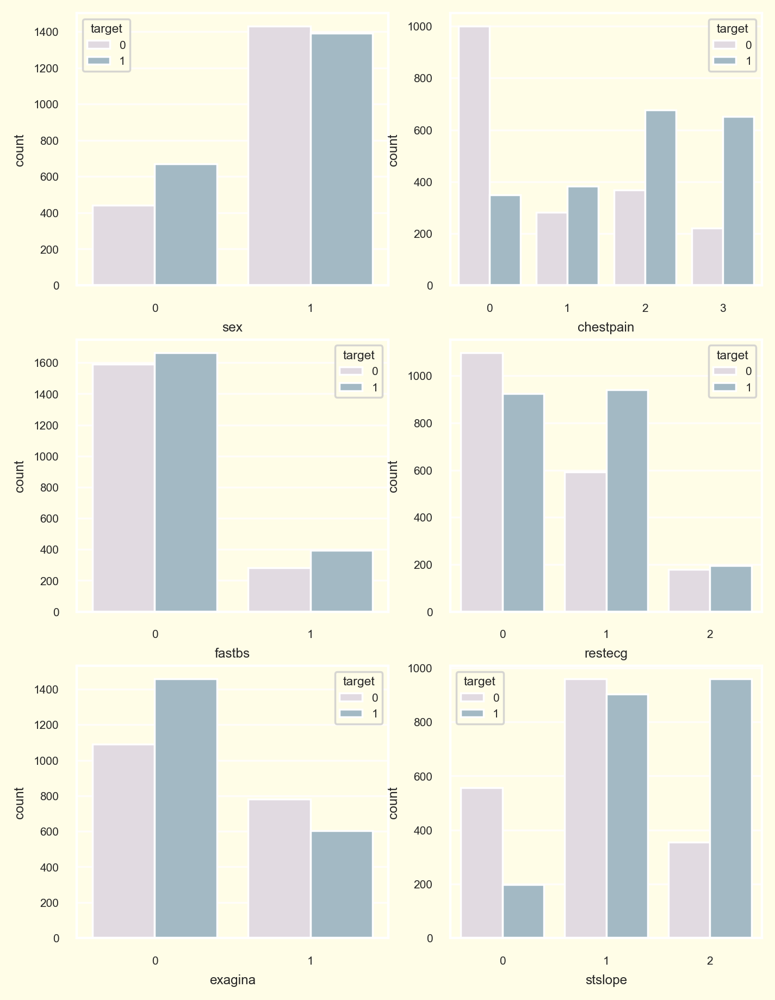

In [22]:
import seaborn as sns

sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)

fig, ax = plt.subplots(3, 2, figsize = (6.5, 9))

for indx, (column, axes) in list(enumerate(list(zip(cat, ax.flatten())))):
    if column not in 'target':
        sns.countplot(ax = axes, x = df[column], hue = df['target'], palette = colors, alpha = 1)  
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]] 

axes_legend = ax.flatten()
axes_legend[1].legend(title = 'target', loc = 'upper right')
axes_legend[2].legend(title = 'target', loc = 'upper right')
plt.show()

Sex (Male: 1, Female: 0)

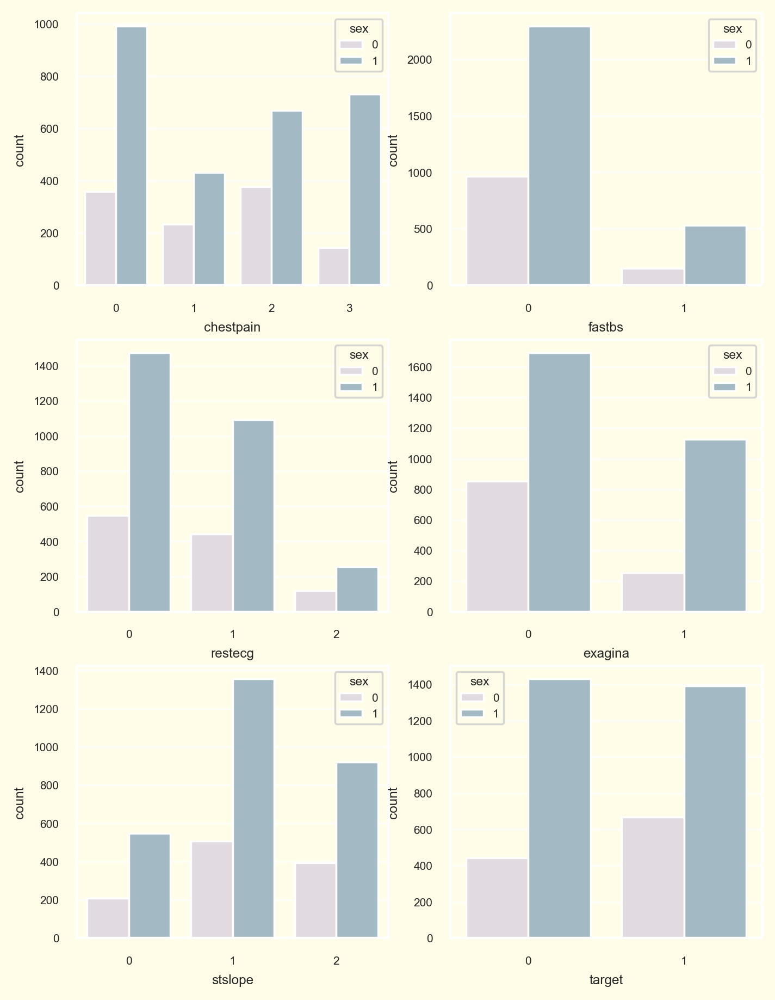

In [23]:
import seaborn as sns

sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)

fig, ax = plt.subplots(3, 2, figsize = (6.5, 9))

for indx, (column, axes) in list(enumerate(list(zip(cat[1:], ax.flatten())))):
    sns.countplot(ax = axes, x = df[column], hue = df['sex'], palette = colors, alpha = 1)  
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]   

axes_legend = ax.flatten()
axes_legend[1].legend(title = 'sex', loc = 'upper right')
axes_legend[2].legend(title = 'sex', loc = 'upper right')
plt.show()

ChestPain (TA: 0, ATA: 1, NAP: 2, ASY: 3)

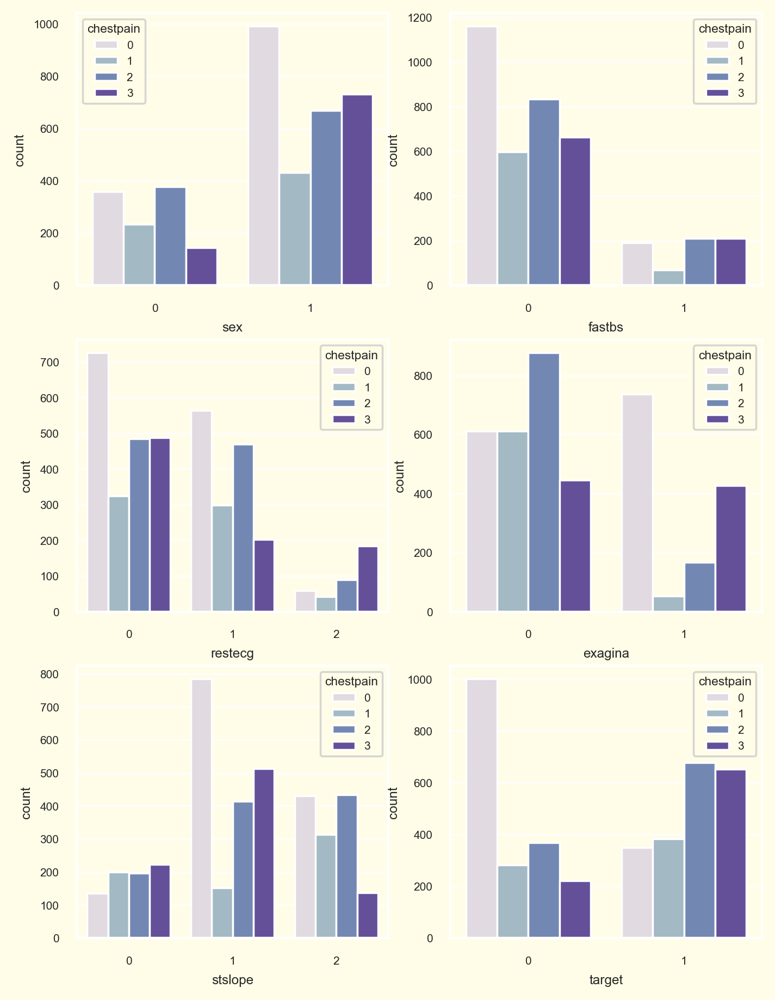

In [24]:
import seaborn as sns
sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)
fig, ax = plt.subplots(3, 2, figsize = (6.5, 9))
cat2 = []
for i in cat:
    if i not in 'chestpain':
        cat2.append(i)
for indx, (column, axes) in list(enumerate(list(zip(cat2, ax.flatten())))):
    sns.countplot(ax = axes, x = df[column], hue = df['chestpain'], palette = colors, alpha = 1)  
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]   
axes_legend = ax.flatten()
axes_legend[1].legend(title = 'chestpain', loc = 'upper right')
axes_legend[2].legend(title = 'chestpain', loc = 'upper right')
plt.show()

Fasting Blood Sugar (< 120mg/dl: 0 (NO), > 120mg/dl: 1 (YES))

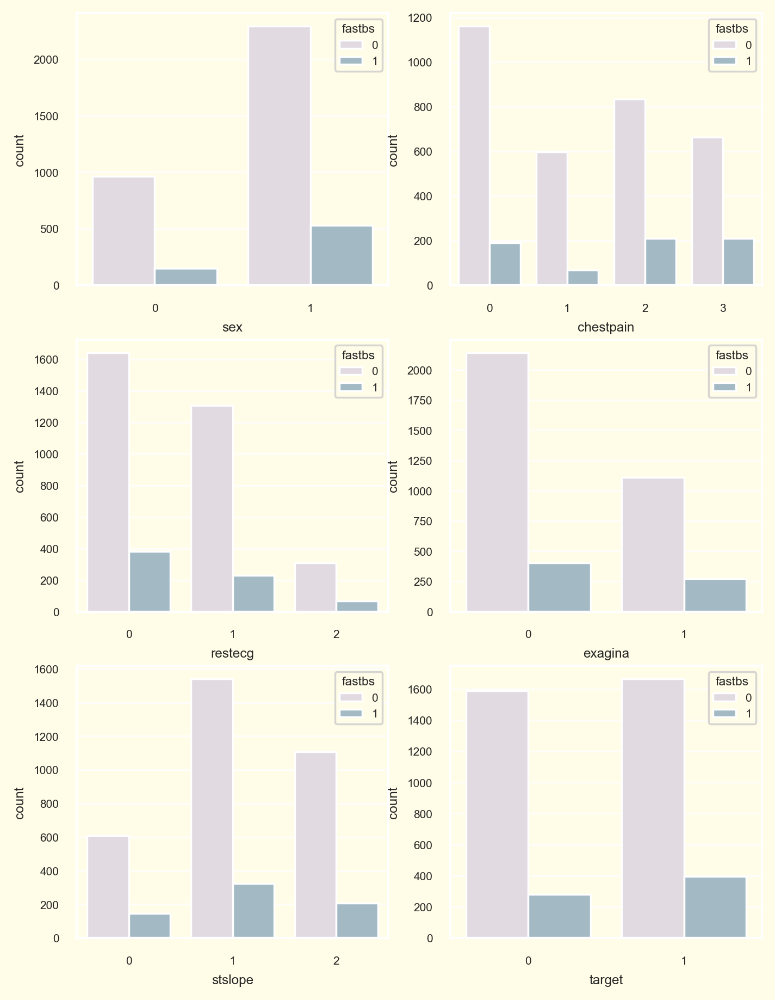

In [25]:
import seaborn as sns

sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)

fig, ax = plt.subplots(3, 2, figsize = (6.5, 9))

cat2 = []
for i in cat:
    if i not in 'fastbs':
        cat2.append(i)
        
for indx, (column, axes) in list(enumerate(list(zip(cat2, ax.flatten())))):
    sns.countplot(ax = axes, x = df[column], hue = df['fastbs'], palette = colors, alpha = 1)  
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]   

axes_legend = ax.flatten()
axes_legend[1].legend(title = 'fastbs', loc = 'upper right')
axes_legend[2].legend(title = 'fastbs', loc = 'upper right')
plt.show()

Resting ECG (Normal: 0, ST: 1, LVH: 2)

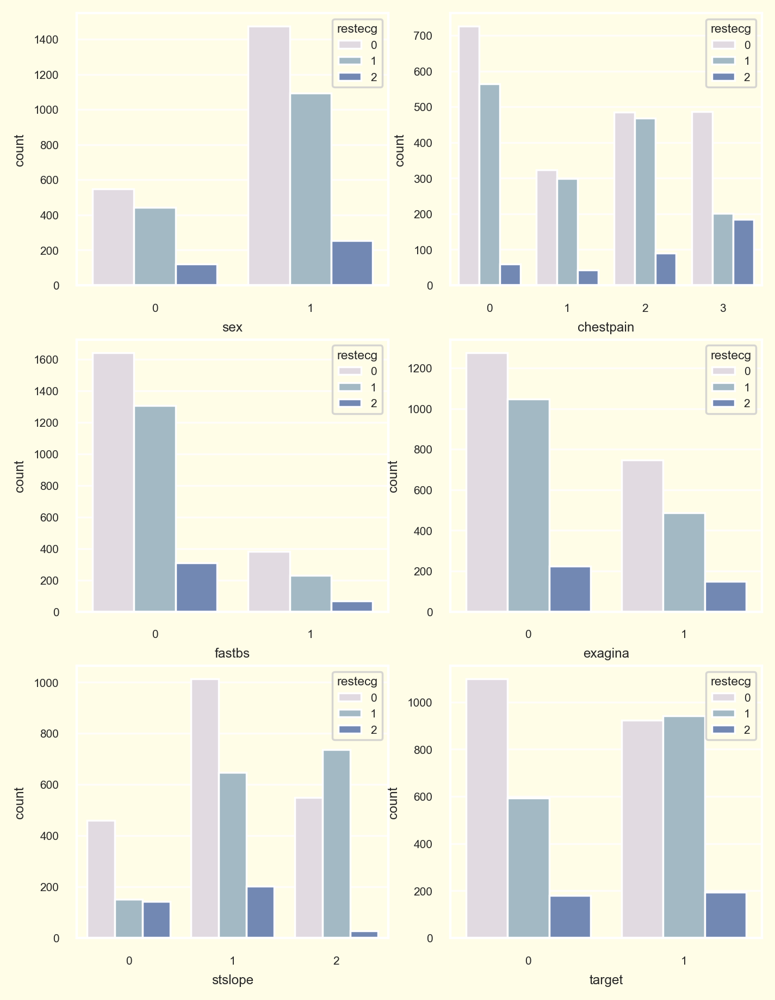

In [26]:
import seaborn as sns

sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)

fig, ax = plt.subplots(3, 2, figsize = (6.5, 9))

cat2 = []
for i in cat:
    if i not in 'restecg':
        cat2.append(i)
        
for indx, (column, axes) in list(enumerate(list(zip(cat2, ax.flatten())))):
    sns.countplot(ax = axes, x = df[column], hue = df['restecg'], palette = colors, alpha = 1)  
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]   

axes_legend = ax.flatten()
axes_legend[1].legend(title = 'restecg', loc = 'upper right')
axes_legend[2].legend(title = 'restecg', loc = 'upper right')
plt.show()

Exercise Angina (NO: 0, YES: 1)

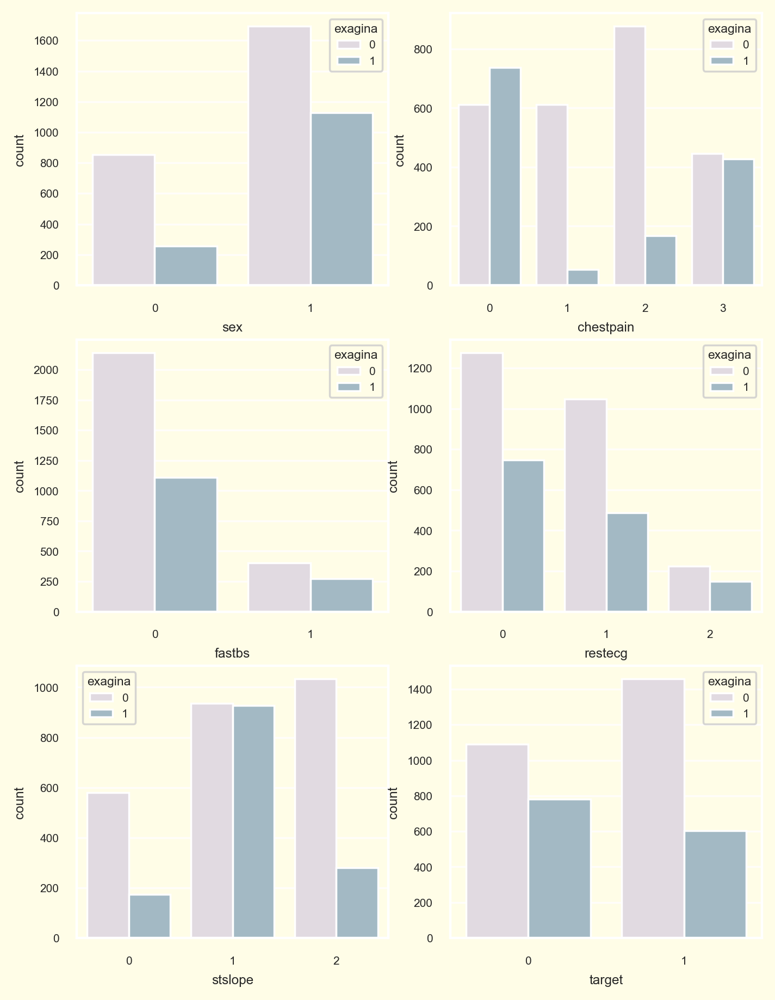

In [27]:
import seaborn as sns

sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)

fig, ax = plt.subplots(3, 2, figsize = (6.5, 9))

cat2 = []
for i in cat:
    if i not in 'exagina':
        cat2.append(i)
        
for indx, (column, axes) in list(enumerate(list(zip(cat2, ax.flatten())))):
    sns.countplot(ax = axes, x = df[column], hue = df['exagina'], palette = colors, alpha = 1)  
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]   

axes_legend = ax.flatten()
axes_legend[1].legend(title = 'exagina', loc = 'upper right')
axes_legend[2].legend(title = 'exagina', loc = 'upper right')
plt.show()

ST Slope (UP: 0, FLAT: 1, DOWN: 2)

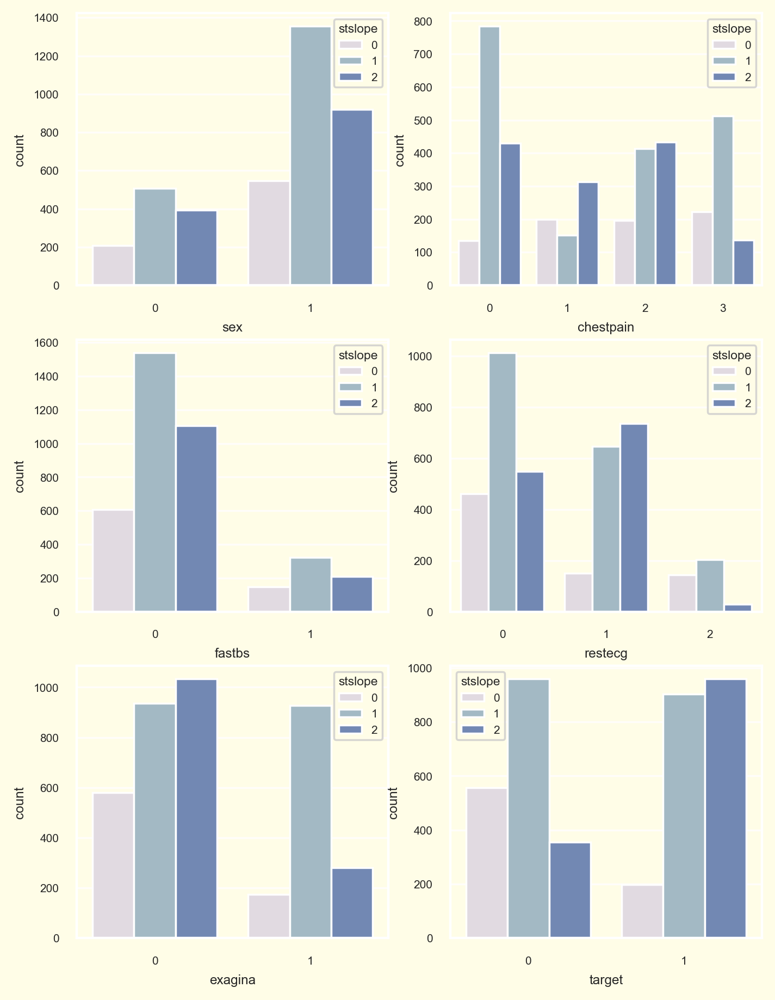

In [28]:
import seaborn as sns

sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)

fig, ax = plt.subplots(3, 2, figsize = (6.5, 9))

cat2 = []
for i in cat:
    if i not in 'stslope':
        cat2.append(i)
        
for indx, (column, axes) in list(enumerate(list(zip(cat2, ax.flatten())))):
    sns.countplot(ax = axes, x = df[column], hue = df['stslope'], palette = colors, alpha = 1)  
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]   

axes_legend = ax.flatten()
axes_legend[1].legend(title = 'stslope', loc = 'upper right')
axes_legend[2].legend(title = 'stslope', loc = 'upper right')
plt.show()

# Violin Plot

Age

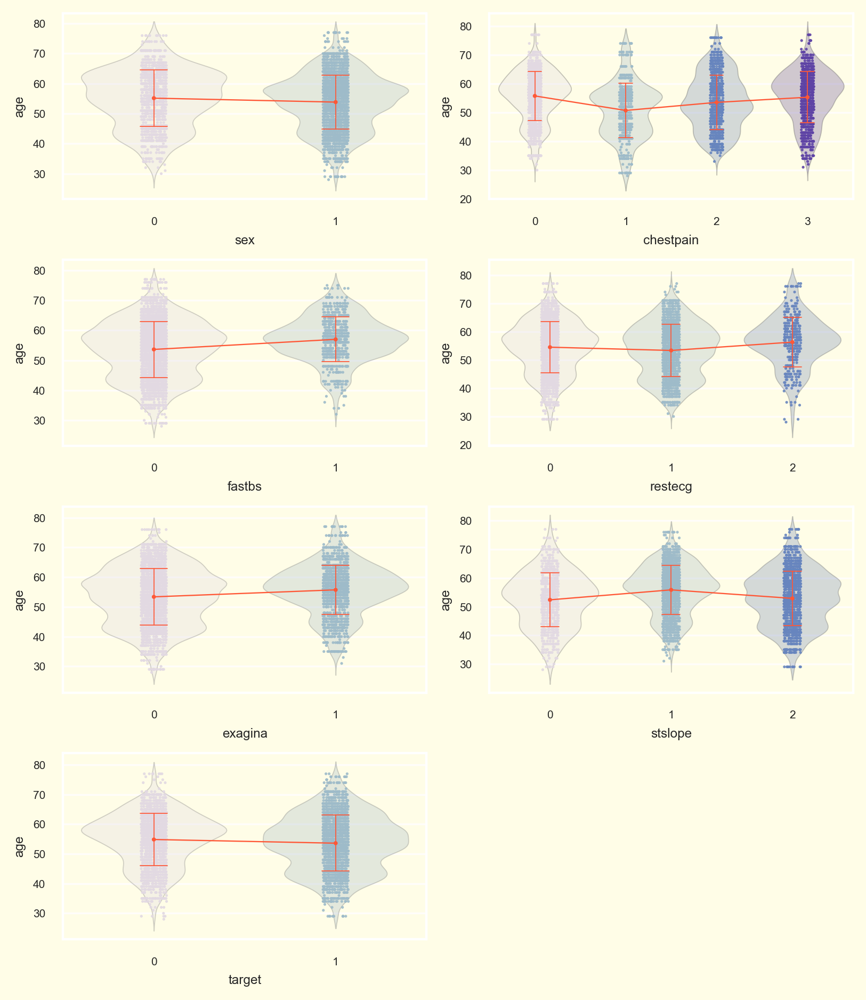

In [29]:
sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)

fig, ax = plt.subplots(4, 2, figsize = (6.5, 7.5))

for indx, (column, axes) in list(enumerate(list(zip(cat, ax.flatten())))):
    
    sns.violinplot(ax = axes, x = df[column], 
                   y = df['age'],
                   scale = 'width', linewidth = 0.5, 
                   palette = colors, inner = None)
    
    plt.setp(axes.collections, alpha = 0.3)
    
    sns.stripplot(ax = axes, x = df[column], 
                  y = df['age'],
                  palette = colors, alpha = 0.9, 
                  s = 1.5, jitter = 0.07)
    sns.pointplot(ax = axes, x = df[column],
                  y = df['age'],
                  color = '#ff5736', scale = 0.25,
                  estimator = np.mean, ci = 'sd',
                  errwidth = 0.5, capsize = 0.15, join = True)
    
    plt.setp(axes.lines, zorder = 100)
    plt.setp(axes.collections, zorder = 100)
    
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]
    
plt.tight_layout()
plt.show()

Resting Blood Pressure

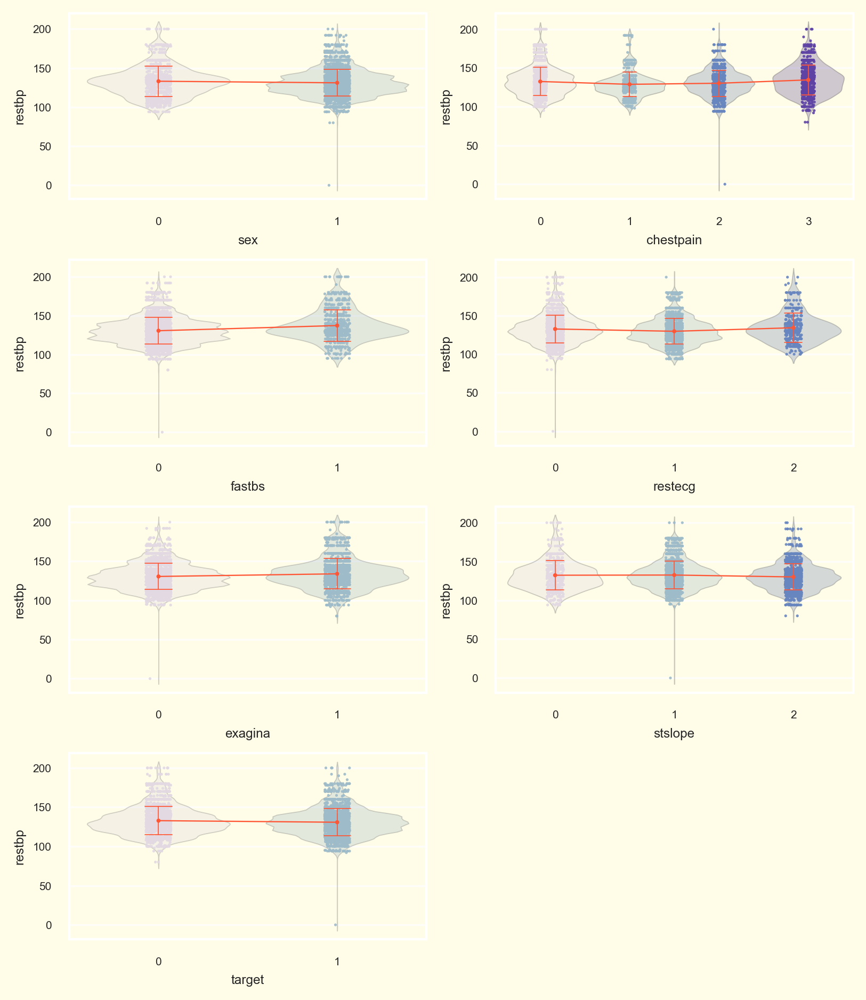

In [30]:
sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)

fig, ax = plt.subplots(4, 2, figsize = (6.5, 7.5))

for indx, (column, axes) in list(enumerate(list(zip(cat, ax.flatten())))):
    
    sns.violinplot(ax = axes, x = df[column], 
                   y = df['restbp'],
                   scale = 'width', linewidth = 0.5, 
                   palette = colors, inner = None)
    
    plt.setp(axes.collections, alpha = 0.3)
    
    sns.stripplot(ax = axes, x = df[column], 
                  y = df['restbp'],
                  palette = colors, alpha = 0.9, 
                  s = 1.5, jitter = 0.07)
    sns.pointplot(ax = axes, x = df[column],
                  y = df['restbp'],
                  color = '#ff5736', scale = 0.25,
                  estimator = np.mean, ci = 'sd',
                  errwidth = 0.5, capsize = 0.15, join = True)
    
    plt.setp(axes.lines, zorder = 100)
    plt.setp(axes.collections, zorder = 100)
    
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]
    
plt.tight_layout()
plt.show()

Cholesterol

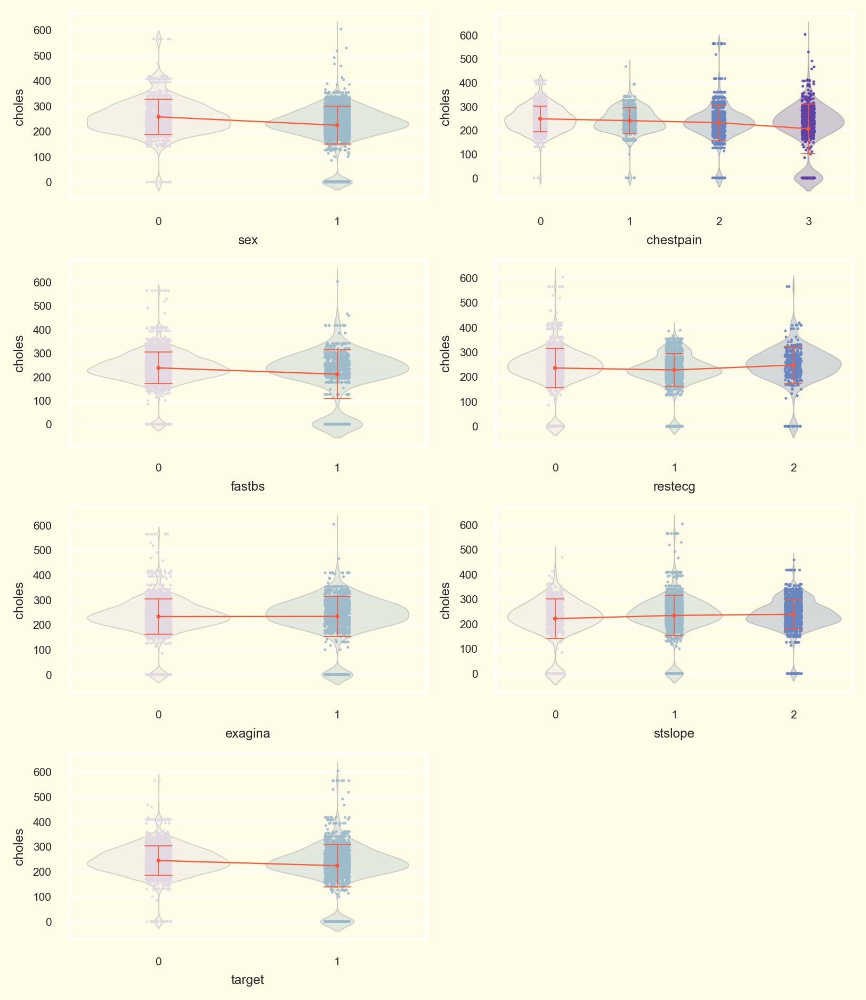

In [31]:
sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)

fig, ax = plt.subplots(4, 2, figsize = (6.5, 7.5))

for indx, (column, axes) in list(enumerate(list(zip(cat, ax.flatten())))):
    
    sns.violinplot(ax = axes, x = df[column], 
                   y = df['choles'],
                   scale = 'width', linewidth = 0.5, 
                   palette = colors, inner = None)
    
    plt.setp(axes.collections, alpha = 0.3)
    
    sns.stripplot(ax = axes, x = df[column], 
                  y = df['choles'],
                  palette = colors, alpha = 0.9, 
                  s = 1.5, jitter = 0.07)
    sns.pointplot(ax = axes, x = df[column],
                  y = df['choles'],
                  color = '#ff5736', scale = 0.25,
                  estimator = np.mean, ci = 'sd',
                  errwidth = 0.5, capsize = 0.15, join = True)
    
    plt.setp(axes.lines, zorder = 100)
    plt.setp(axes.collections, zorder = 100)
    
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]
    
plt.tight_layout()
plt.show()

Maximum Heart Rate

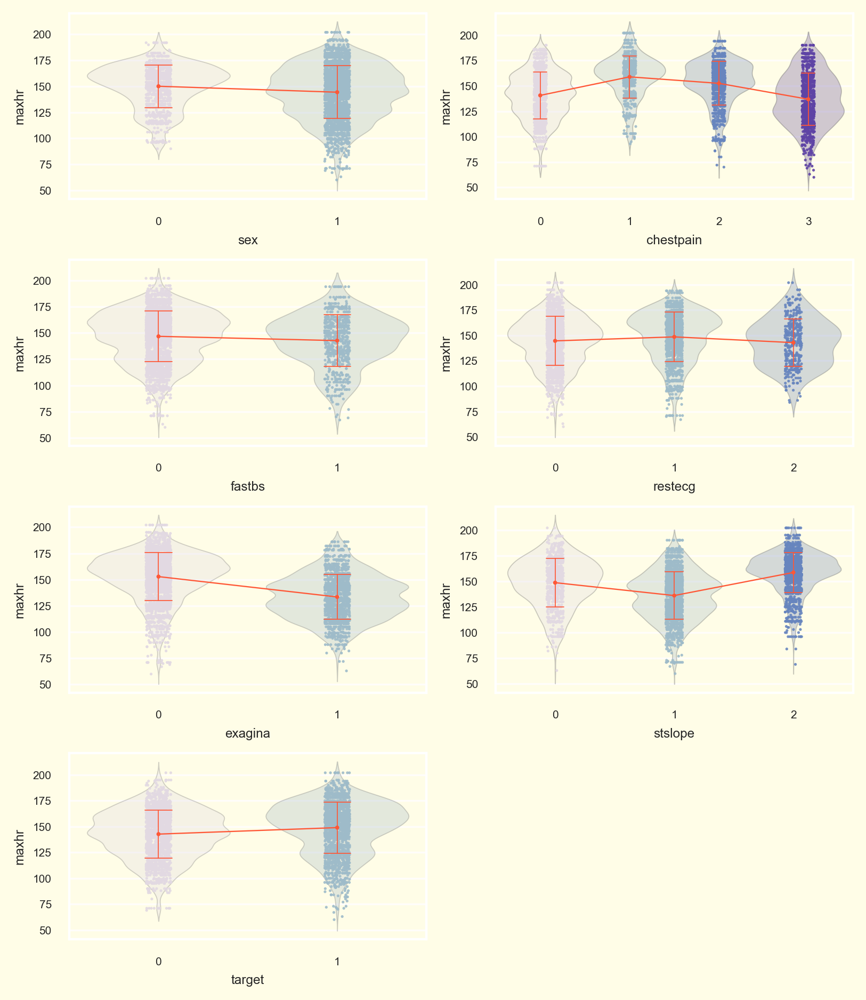

In [32]:
sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)

fig, ax = plt.subplots(4, 2, figsize = (6.5, 7.5))

for indx, (column, axes) in list(enumerate(list(zip(cat, ax.flatten())))):
    
    sns.violinplot(ax = axes, x = df[column], 
                   y = df['maxhr'],
                   scale = 'width', linewidth = 0.5, 
                   palette = colors, inner = None)
    
    plt.setp(axes.collections, alpha = 0.3)
    
    sns.stripplot(ax = axes, x = df[column], 
                  y = df['maxhr'],
                  palette = colors, alpha = 0.9, 
                  s = 1.5, jitter = 0.07)
    sns.pointplot(ax = axes, x = df[column],
                  y = df['maxhr'],
                  color = '#ff5736', scale = 0.25,
                  estimator = np.mean, ci = 'sd',
                  errwidth = 0.5, capsize = 0.15, join = True)
    
    plt.setp(axes.lines, zorder = 100)
    plt.setp(axes.collections, zorder = 100)
    
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]
    
plt.tight_layout()
plt.show()

Old Peak

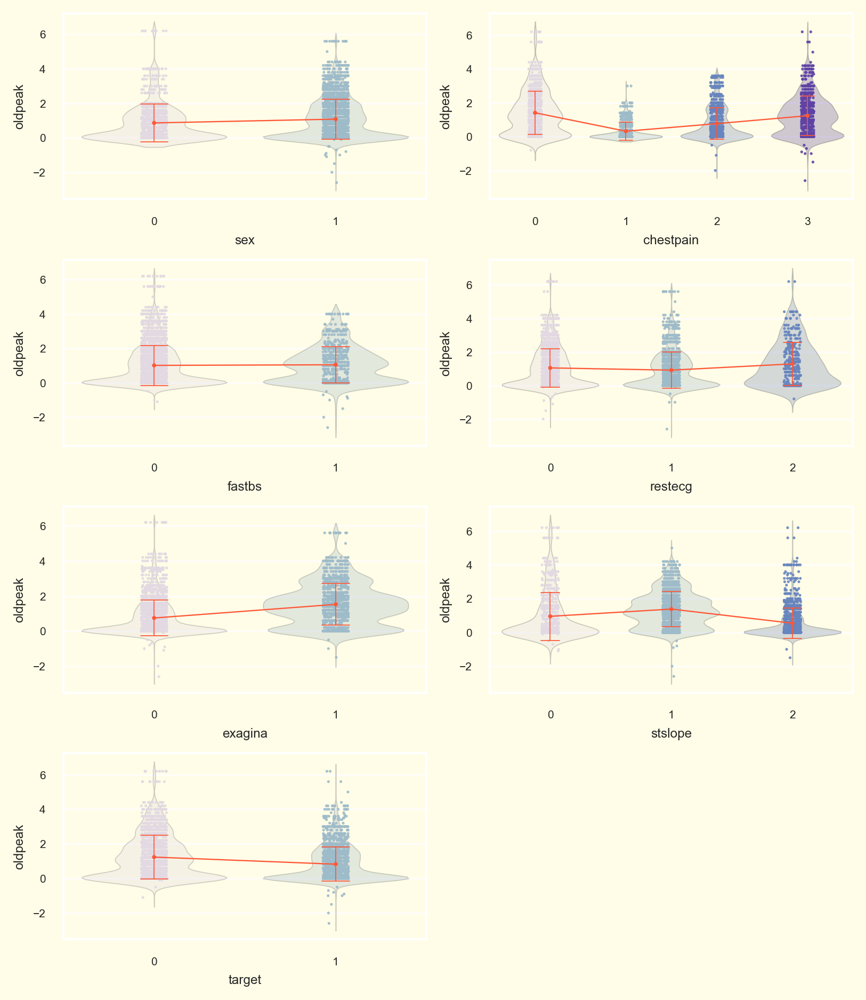

In [33]:
sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 7, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)

fig, ax = plt.subplots(4, 2, figsize = (6.5, 7.5))

for indx, (column, axes) in list(enumerate(list(zip(cat, ax.flatten())))):
    
    sns.violinplot(ax = axes, x = df[column], 
                   y = df['oldpeak'],
                   scale = 'width', linewidth = 0.5, 
                   palette = colors, inner = None)
    
    plt.setp(axes.collections, alpha = 0.3)
    
    sns.stripplot(ax = axes, x = df[column], 
                  y = df['oldpeak'],
                  palette = colors, alpha = 0.9, 
                  s = 1.5, jitter = 0.07)
    sns.pointplot(ax = axes, x = df[column],
                  y = df['oldpeak'],
                  color = '#ff5736', scale = 0.25,
                  estimator = np.mean, ci = 'sd',
                  errwidth = 0.5, capsize = 0.15, join = True)
    
    plt.setp(axes.lines, zorder = 100)
    plt.setp(axes.collections, zorder = 100)
    
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]
    
plt.tight_layout()
plt.show()

# Scatter Plot

Target = Heart Disease (Don't Have: 0, Have: 1)

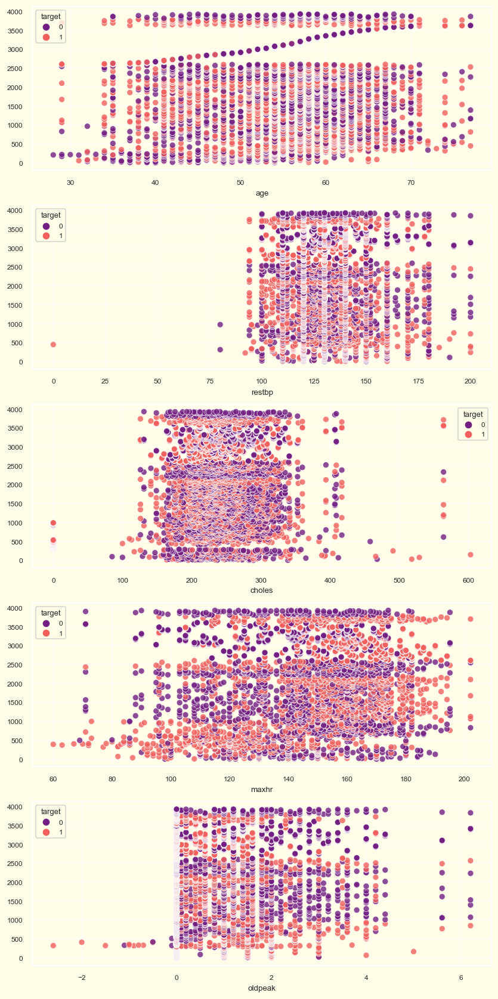

In [34]:
sns.set_theme(rc = {'figure.dpi': 120, 'axes.labelsize': 8, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.65)

fig, ax = plt.subplots(5, 1, figsize = (7, 14))

for indx, (column, axes) in list(enumerate(list(zip(num, ax.flatten())))):
    
    sns.scatterplot(ax = axes, y = df[column].index, x = df[column], 
                    hue = df['target'], palette = 'magma', alpha = 0.8)
    
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]
    
plt.tight_layout()
plt.show()

# Histogram Plot

Target = Heart Disease (Don't Have: 0, Have: 1)

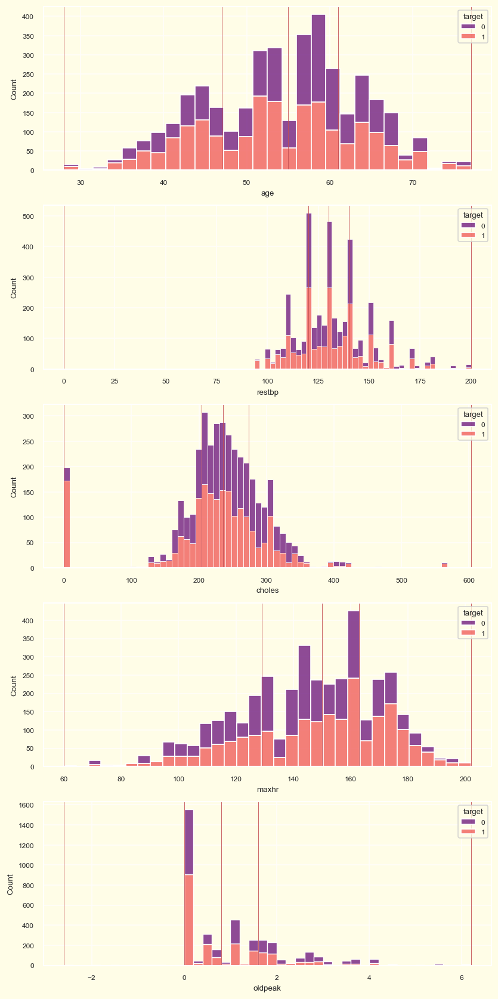

In [35]:
sns.set_theme(rc = {'figure.dpi': 120, 'axes.labelsize': 8, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.65)

fig, ax = plt.subplots(5, 1, figsize = (7, 14))

for indx, (column, axes) in list(enumerate(list(zip(num, ax.flatten())))):
    
    sns.histplot(ax = axes, x = df[column], hue = df['target'], 
                 palette = 'magma', alpha = 0.8, multiple = 'stack')
    
    legend = axes.get_legend() # sns.hisplot has some issues with legend
    handles = legend.legendHandles
    legend.remove()
    axes.legend(handles, ['0', '1'], title = 'target', loc = 'upper right')
    Quantiles = np.quantile(df[column], [0, 0.25, 0.50, 0.75, 1])
    
    for q in Quantiles: axes.axvline(x = q, linewidth = 0.5, color = 'r')
        
plt.tight_layout()
plt.show()

# Box Plot

Target = Heart Disease (Don't Have: 0, Have: 1)

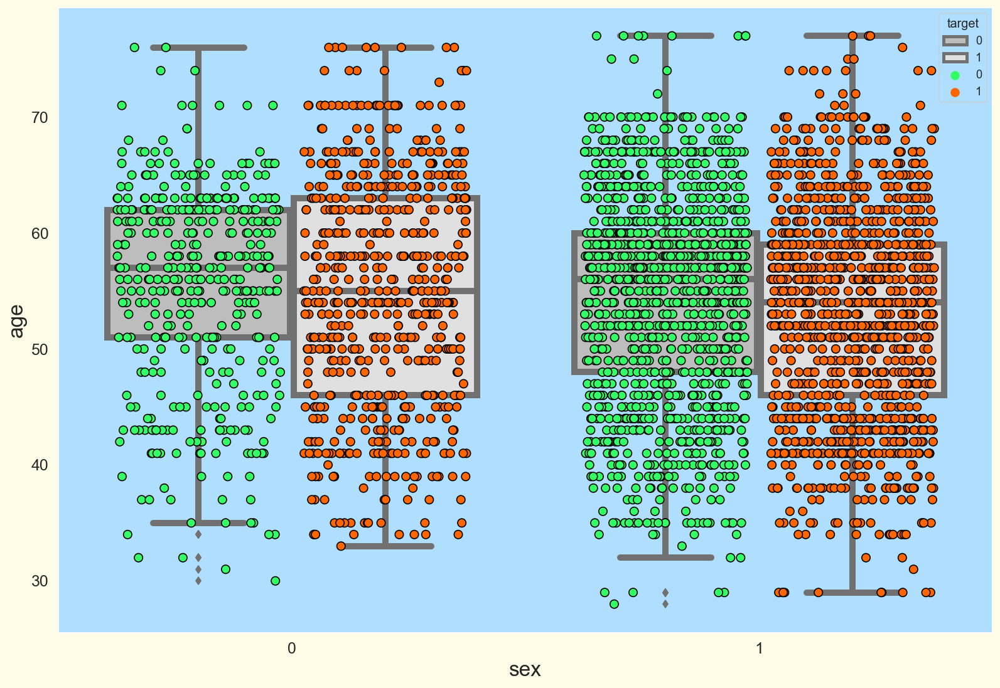

In [36]:
plt.figure(figsize=(16,11))
sns.set(rc={"axes.facecolor":"#b0deff","axes.grid":False,
            'xtick.labelsize':15,'ytick.labelsize':15,
            'axes.labelsize':20,'figure.figsize':(20.0, 9.0)})
params = dict(data=df ,x = df.sex ,y = df.age ,hue=df.target,dodge=True)
sns.stripplot(**params , size=8,jitter=0.35,palette=['#33FF66','#FF6600'],edgecolor='black',linewidth=1)
sns.boxplot(**params ,palette=['#BDBDBD','#E0E0E0'],linewidth=6)
plt.show()

In [37]:
# Check category
cat

['sex', 'chestpain', 'fastbs', 'restecg', 'exagina', 'stslope', 'target']

Age with Chest Pain

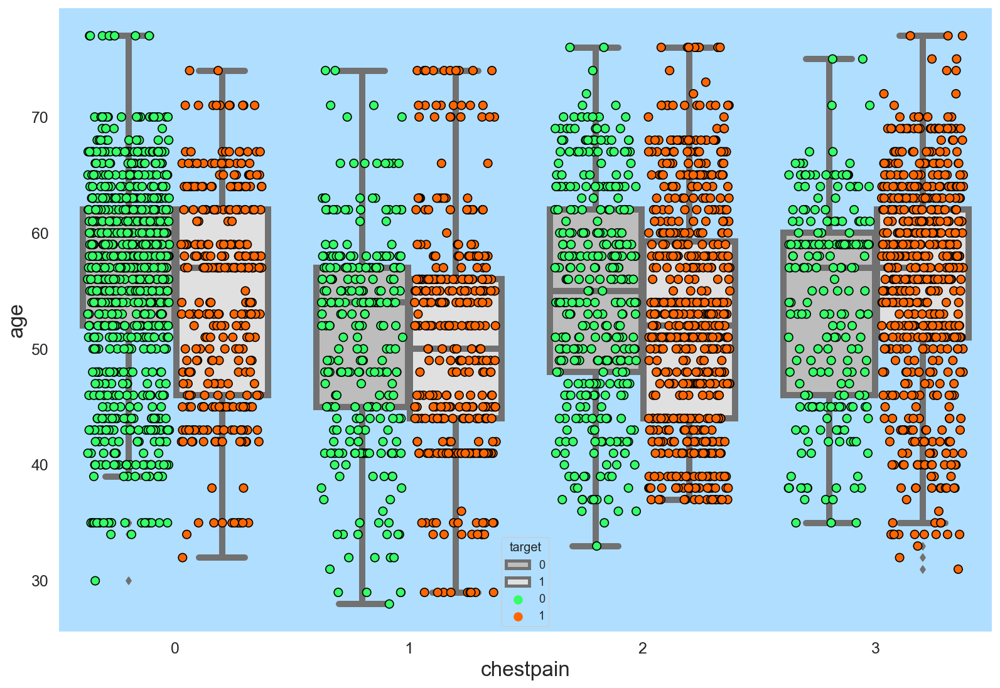

In [38]:
plt.figure(figsize=(16,11))

sns.set(rc={"axes.facecolor":"#b0deff","axes.grid":False,
            'xtick.labelsize':15,'ytick.labelsize':15,
            'axes.labelsize':20,'figure.figsize':(20.0, 9.0)})

params = dict(data=df ,x = df.chestpain,y = df.age ,hue=df.target,dodge=True)

sns.stripplot(**params , size=8,jitter=0.35,palette=['#33FF66','#FF6600'],edgecolor='black',linewidth=1)
sns.boxplot(**params ,palette=['#BDBDBD','#E0E0E0'],linewidth=6)
plt.show()

In [39]:
#Filter target (HeartDisease) only head
df1 = df[df['target'].isin([0,1])]
df1.head()

,age,sex,chestpain,restbp,choles,fastbs,restecg,maxhr,exagina,oldpeak,stslope,target
0,40,1,1,140,289,0,0,172,0,0.0,0,0
1,37,1,1,130,283,0,1,98,0,0.0,0,0
2,54,1,2,150,195,0,0,122,0,0.0,0,0
3,39,1,2,120,339,0,0,170,0,0.0,0,0
4,45,0,1,130,237,0,0,170,0,0.0,0,0


# Plot with subset of variable

Sex with (Age, Restbp, Choles)

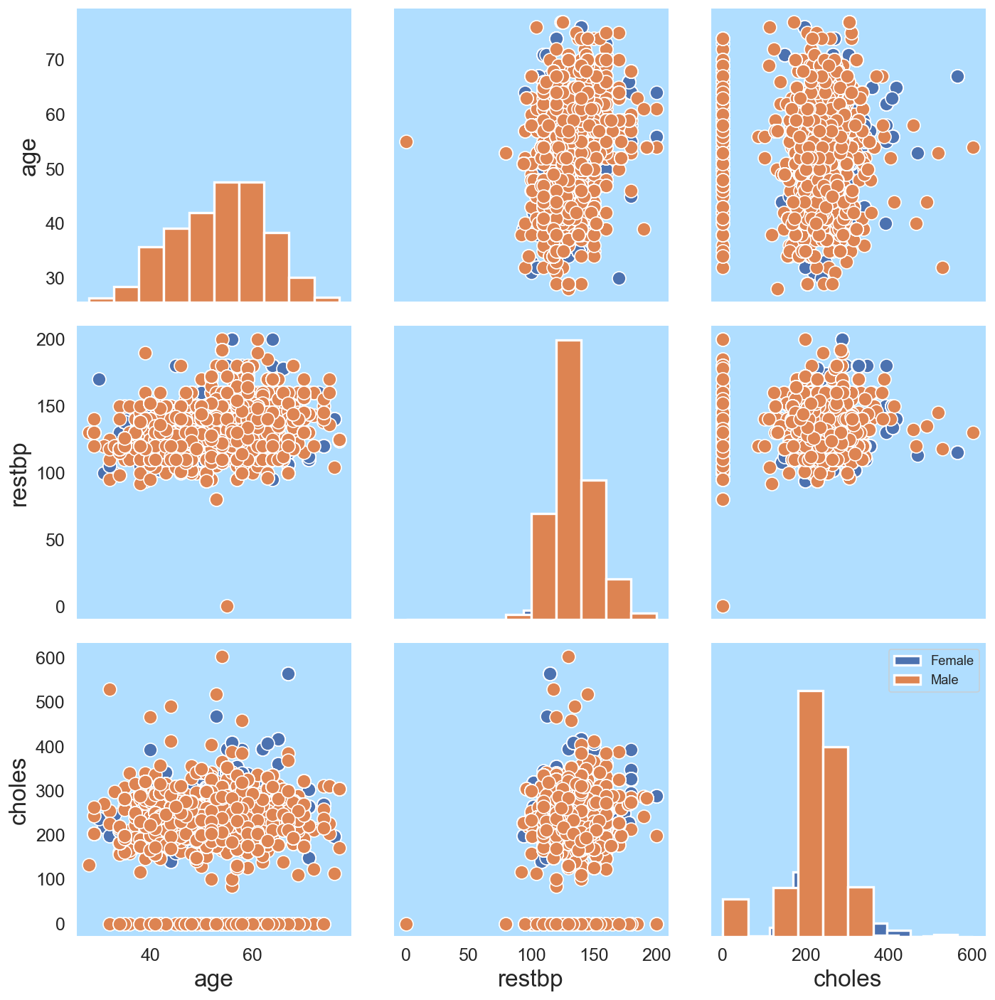

In [40]:
g = sns.PairGrid(df1 , hue='sex' ,vars=["age","restbp","choles"],height=4, aspect=1)
g = g.map_offdiag(plt.scatter , edgecolor="w", s=130)
g = g.map_diag(plt.hist , edgecolor ='w', linewidth=2)
plt.legend(["Female","Male"])
plt.show()

Sex with (Maxhr, Oldpeak)

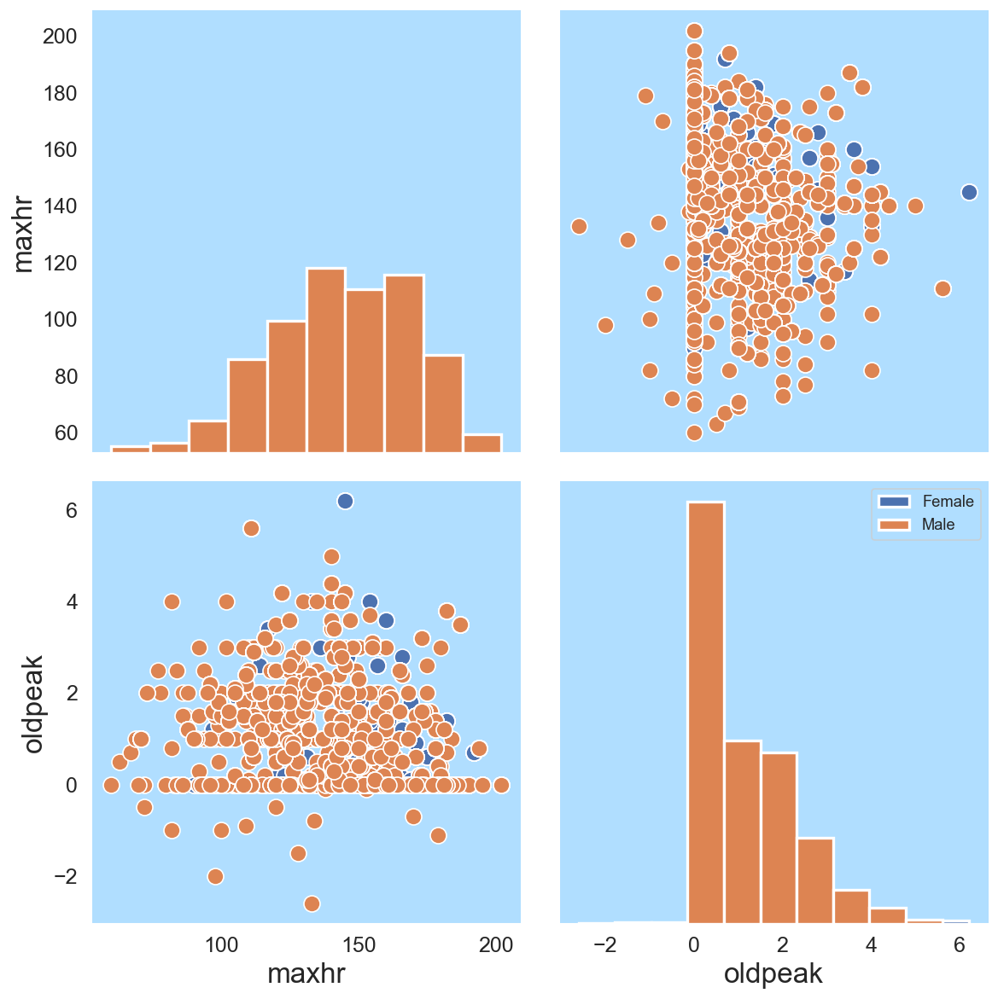

In [41]:
g = sns.PairGrid(df1 , hue='sex' ,vars=["maxhr","oldpeak"],height=5, aspect=1)
g = g.map_offdiag(plt.scatter , edgecolor="w", s=130)
g = g.map_diag(plt.hist , edgecolor ='w', linewidth=2)
plt.legend(["Female","Male"])
plt.show()

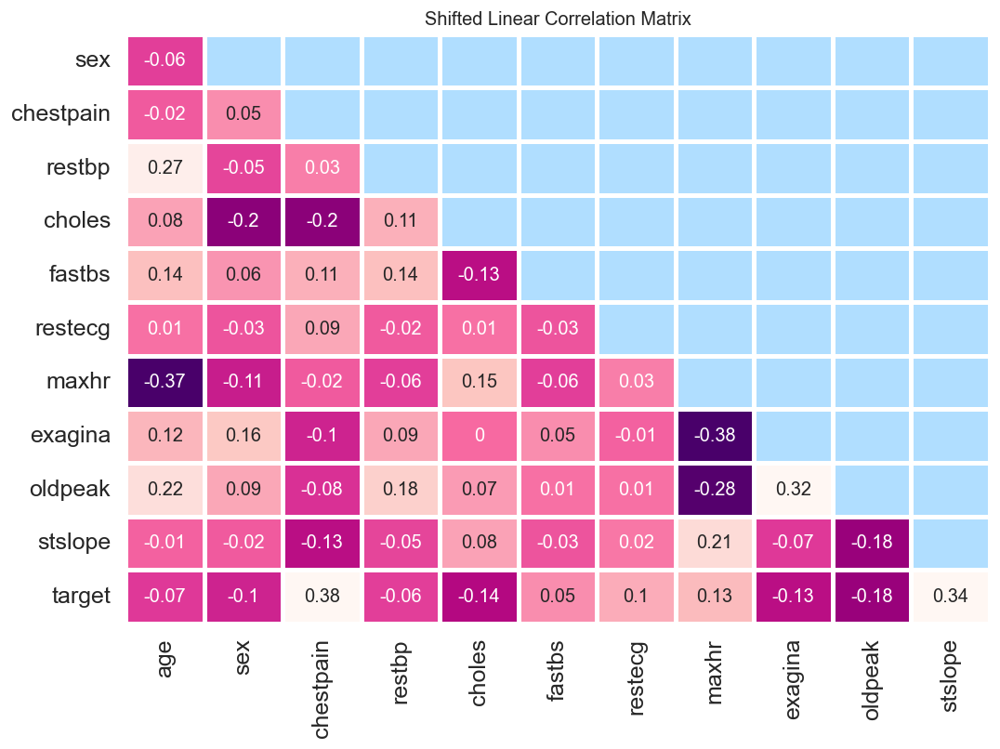

In [42]:
''' Plot a Shifted Correlation Matrix '''
# Diagonal correlation is always unity & less relevant, shifted variant shows only relevant cases
def corrMat(df,id=False):
    
    corr_mat = df.corr().round(2)
    f, ax = plt.subplots(figsize=(10,7))
    mask = np.triu(np.ones_like(corr_mat, dtype=bool))
    mask = mask[1:,:-1]
    corr = corr_mat.iloc[1:,:-1].copy()
    sns.heatmap(corr,mask=mask,vmin=-0.3,vmax=0.3,center=0, 
                cmap='RdPu_r',square=False,lw=2,annot=True,cbar=False)
#     bottom, top = ax.get_ylim() 
#     ax.set_ylim(bottom + 0.5, top - 0.5) 
    ax.set_title('Shifted Linear Correlation Matrix')
    
corrMat(df)

# Show Average (Mean)

In [43]:
# Check average age (same for both male and female)
df2 = df.groupby('sex').agg({'age' : 'mean', "chestpain":'count','restbp':'mean','choles':'mean',
                            'fastbs':'sum','restecg':'count','maxhr':'mean','exagina':'count','oldpeak':'mean',
                            'stslope':'count','target':'sum'})
df2

,age,chestpain,restbp,choles,fastbs,restecg,maxhr,exagina,oldpeak,stslope,target
sex,,,,,,,,,,,
0,55.153153,1110,133.165766,257.363063,148,1110,150.109910,1110,0.861892,1110,669
1,53.839064,2821,131.156328,223.989720,529,2821,144.390642,2821,1.081709,2821,1391


In [44]:
px.bar(data_frame=df2, barmode='group',
       title = "<b>Gender wise Analyzing (Female: 0, Male: 1)</b>",template="plotly_dark")

# Check Stat

Age

In [45]:
df.sex.value_counts()

1    2821
0    1110
Name: sex, dtype: int64

With Heart Disease (Target = 1)

In [46]:
df.sex[df.target==1].value_counts()

1    1391
0     669
Name: sex, dtype: int64

Sex With Heart Disease

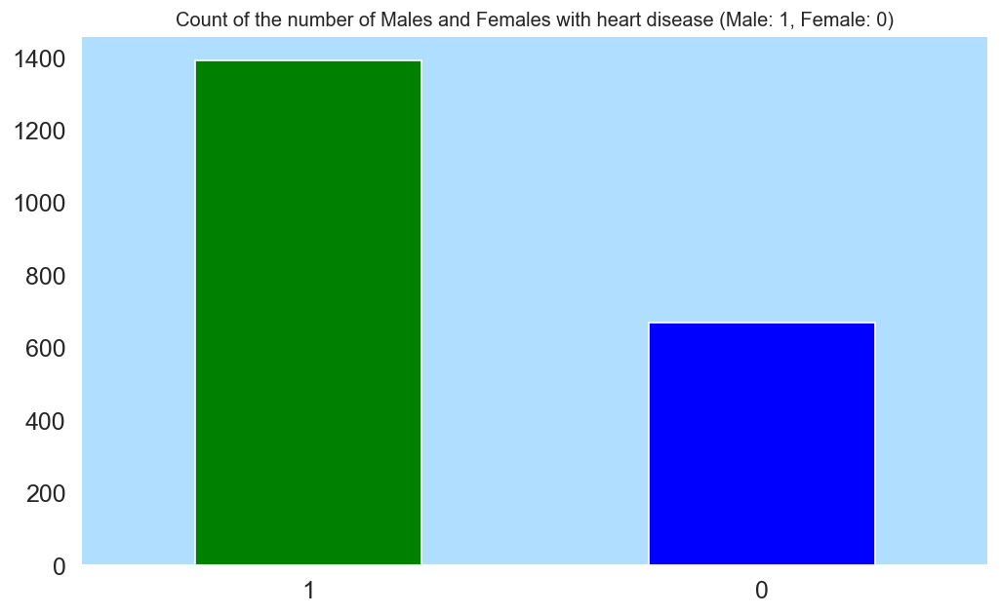

In [47]:
df.sex[df.target==1].value_counts().plot(kind='bar',figsize=(10,6),color=['green','blue'])

plt.title("Count of the number of Males and Females with heart disease (Male: 1, Female: 0)")
plt.xticks(rotation=0);

Crosstab for Sex With Heart Disease (Male: 1, Female: 0; Heart Disease: 1, No Heart Disease: 0)

In [48]:
pd.crosstab(df.target,df.sex)

sex,0,1
target,,
0,441,1430
1,669,1391


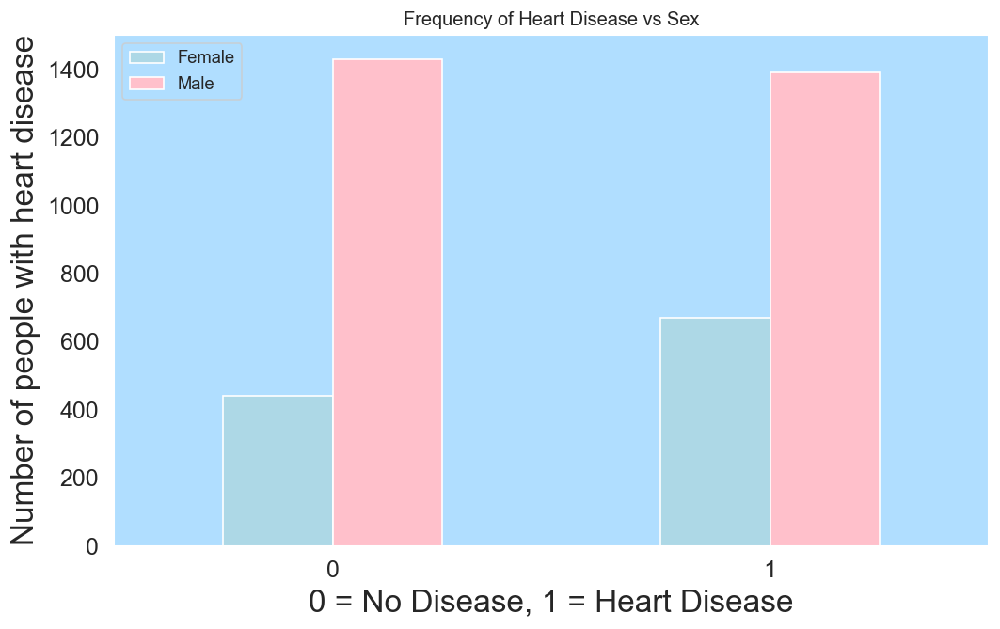

In [49]:
pd.crosstab(df.target,df.sex).plot(kind='bar',figsize=(10,6),color=["lightblue","pink"])
plt.title("Frequency of Heart Disease vs Sex")
plt.xlabel("0 = No Disease, 1 = Heart Disease")
plt.ylabel("Number of people with heart disease")
plt.legend(["Female","Male"])
plt.xticks(rotation=0);

In [50]:
df.corr()

,age,sex,chestpain,restbp,choles,fastbs,restecg,maxhr,exagina,oldpeak,stslope,target
age,1.000000,-0.064548,-0.021610,0.269029,0.082893,0.138343,0.008976,-0.372692,0.122293,0.221901,-0.013687,-0.067635
sex,-0.064548,1.000000,0.049812,-0.050824,-0.201108,0.064606,-0.031786,-0.105954,0.159497,0.086496,-0.022148,-0.098801
chestpain,-0.021610,0.049812,1.000000,0.028763,-0.199055,0.111294,0.089206,-0.018305,-0.101901,-0.077434,-0.133072,0.382176
restbp,0.269029,-0.050824,0.028763,1.000000,0.109356,0.141126,-0.022320,-0.063115,0.090267,0.182057,-0.050893,-0.056205
choles,0.082893,-0.201108,-0.199055,0.109356,1.000000,-0.134411,0.007177,0.146207,0.004776,0.065786,0.078464,-0.136984
fastbs,0.138343,0.064606,0.111294,0.141126,-0.134411,1.000000,-0.032056,-0.063130,0.047463,0.012076,-0.032631,0.054266
restecg,0.008976,-0.031786,0.089206,-0.022320,0.007177,-0.032056,1.000000,0.025519,-0.013042,0.013952,0.017168,0.103652
maxhr,-0.372692,-0.105954,-0.018305,-0.063115,0.146207,-0.063130,0.025519,1.000000,-0.381264,-0.277590,0.214082,0.128951
exagina,0.122293,0.159497,-0.101901,0.090267,0.004776,0.047463,-0.013042,-0.381264,1.000000,0.324192,-0.068272,-0.130399
oldpeak,0.221901,0.086496,-0.077434,0.182057,0.065786,0.012076,0.013952,-0.277590,0.324192,1.000000,-0.179380,-0.179773


<AxesSubplot:>

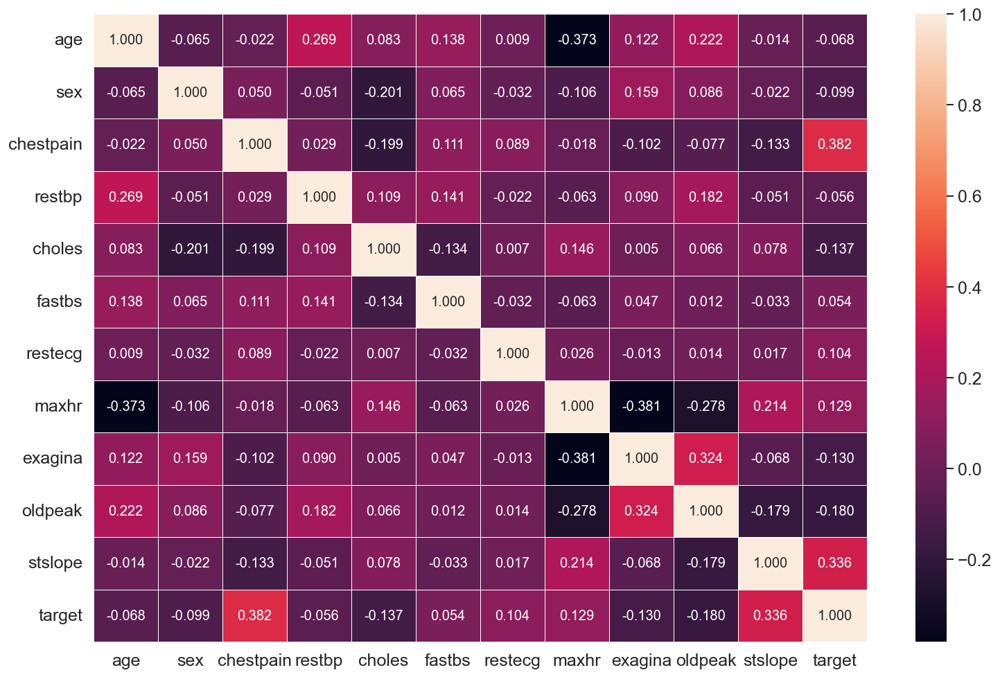

In [51]:
cor_mat=df.corr()
fig,ax=plt.subplots(figsize=(15,10))
sns.heatmap(cor_mat,annot=True,linewidths=0.5,fmt=".3f")

# Data Preprocessing

In [52]:
from sklearn.preprocessing import MinMaxScaler
scal=MinMaxScaler()
feat=['age', 'sex', 'chestpain', 'restbp', 'choles', 'fastbs', 'restecg', 'maxhr', 'exagina', 'oldpeak', 'stslope']
df[feat] = scal.fit_transform(df[feat])
df.head()

,age,sex,chestpain,restbp,choles,fastbs,restecg,maxhr,exagina,oldpeak,stslope,target
0,0.244898,1.0,0.333333,0.70,0.479270,0.0,0.0,0.788732,0.0,0.295455,0.0,0
1,0.183673,1.0,0.333333,0.65,0.469320,0.0,0.5,0.267606,0.0,0.295455,0.0,0
2,0.530612,1.0,0.666667,0.75,0.323383,0.0,0.0,0.436620,0.0,0.295455,0.0,0
3,0.224490,1.0,0.666667,0.60,0.562189,0.0,0.0,0.774648,0.0,0.295455,0.0,0
4,0.346939,0.0,0.333333,0.65,0.393035,0.0,0.0,0.774648,0.0,0.295455,0.0,0


In [53]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
features=['age', 'restbp', 'choles', 'maxhr', 'oldpeak']
#df[features] = scaler.fit_transform(df[features])
df.head()

,age,sex,chestpain,restbp,choles,fastbs,restecg,maxhr,exagina,oldpeak,stslope,target
0,0.244898,1.0,0.333333,0.70,0.479270,0.0,0.0,0.788732,0.0,0.295455,0.0,0
1,0.183673,1.0,0.333333,0.65,0.469320,0.0,0.5,0.267606,0.0,0.295455,0.0,0
2,0.530612,1.0,0.666667,0.75,0.323383,0.0,0.0,0.436620,0.0,0.295455,0.0,0
3,0.224490,1.0,0.666667,0.60,0.562189,0.0,0.0,0.774648,0.0,0.295455,0.0,0
4,0.346939,0.0,0.333333,0.65,0.393035,0.0,0.0,0.774648,0.0,0.295455,0.0,0


# Feature Scaling

In [54]:
X=df.drop("target",axis=1).values
Y=df.target.values

# Feature Selection

Split data into training and testing sets

In [55]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=42)

# Machine Learning

Function For evaluating metrics

In [56]:
from sklearn.metrics import accuracy_score,recall_score,f1_score,precision_score,roc_auc_score,confusion_matrix

def evaluation(Y_test,Y_pred):
    acc=accuracy_score(Y_test,Y_pred)
    rcl=recall_score(Y_test,Y_pred)
    f1=f1_score(Y_test,Y_pred)
 

    metric_dict={'accuracy': round(acc,3),
               'recall': round(rcl,3),
               'F1 score': round(f1,3),
               
              }

    return print(metric_dict)

#evaluation(Y_test,SVC_Y_pred)

# Fitting and Comparing Different Models

# KNN

In [57]:
np.random.seed(42)
from sklearn.neighbors import KNeighborsClassifier
Knn_clf=  KNeighborsClassifier()
Knn_clf.fit(X_train,Y_train)
Knn_Y_pred=Knn_clf.predict(X_test)
Knn_score=Knn_clf.score(X_test,Y_test)
#print(Knn_score)
evaluation(Y_test,Knn_Y_pred)

{'accuracy': 0.936, 'recall': 0.945, 'F1 score': 0.94}


# Random Forest

In [58]:
np.random.seed(42)
from sklearn.ensemble import RandomForestClassifier
RF_clf=RandomForestClassifier(n_estimators=40)
RF_clf.fit(X_train,Y_train)
RF_score=RF_clf.score(X_test,Y_test)
RF_Y_pred=RF_clf.predict(X_test)
#print(RF_score)
evaluation(Y_test,RF_Y_pred)

{'accuracy': 0.973, 'recall': 0.974, 'F1 score': 0.975}


In [59]:
model_comp = pd.DataFrame({'Model': ['Random Forest','K-Nearest Neighbour'], 'Accuracy': [RF_score*100,Knn_score*100]})
model_comp

,Model,Accuracy
0,Random Forest,97.331639
1,K-Nearest Neighbour,93.646760


# Tuning KNN

In [60]:
neighbors = range(1, 21) # 1 to 20

# Setup algorithm
knn = KNeighborsClassifier()

# Loop through different neighbors values
for i in neighbors:
    knn.set_params(n_neighbors = i) # set neighbors value
    
    # Fit the algorithm
    print(f"Accuracy with {i} no. of neighbors: {knn.fit(X_train, Y_train).score(X_test,Y_test)}%")

Accuracy with 1 no. of neighbors: 0.9669631512071156%
Accuracy with 2 no. of neighbors: 0.9390088945362135%
Accuracy with 3 no. of neighbors: 0.9250317662007624%
Accuracy with 4 no. of neighbors: 0.9250317662007624%
Accuracy with 5 no. of neighbors: 0.9364675984752223%
Accuracy with 6 no. of neighbors: 0.9250317662007624%
Accuracy with 7 no. of neighbors: 0.9161372299872935%
Accuracy with 8 no. of neighbors: 0.8996188055908514%
Accuracy with 9 no. of neighbors: 0.9021601016518425%
Accuracy with 10 no. of neighbors: 0.9034307496823379%
Accuracy with 11 no. of neighbors: 0.8996188055908514%
Accuracy with 12 no. of neighbors: 0.8831003811944091%
Accuracy with 13 no. of neighbors: 0.8640406607369758%
Accuracy with 14 no. of neighbors: 0.8475222363405337%
Accuracy with 15 no. of neighbors: 0.8310038119440915%
Accuracy with 16 no. of neighbors: 0.8233799237611181%
Accuracy with 17 no. of neighbors: 0.8310038119440915%
Accuracy with 18 no. of neighbors: 0.8310038119440915%
Accuracy with 19 no

In [61]:
np.random.seed(42)
from sklearn.neighbors import KNeighborsClassifier
Knn_clf=  KNeighborsClassifier(n_neighbors=9)
Knn_clf.fit(X_train,Y_train)
Knn_Y_pred=Knn_clf.predict(X_test)
Knn_score=Knn_clf.score(X_test,Y_test)
evaluation(Y_test,Knn_Y_pred)

{'accuracy': 0.902, 'recall': 0.907, 'F1 score': 0.908}


# Tuning Random Forest

In [62]:
from sklearn.ensemble import RandomForestClassifier
np.random.seed(42)
for i in range(1,40,1):
    print(f"With {i*10} estimators:")
    clf2=RandomForestClassifier(n_estimators=i*10,max_depth=i,random_state=i).fit(X_train,Y_train)
    print(f"Accuracy: {clf2.score(X_test,Y_test)*100:2f}%")

With 10 estimators:
Accuracy: 69.250318%
With 20 estimators:
Accuracy: 74.078780%
With 30 estimators:
Accuracy: 78.780178%
With 40 estimators:
Accuracy: 79.415502%
With 50 estimators:
Accuracy: 82.592122%
With 60 estimators:
Accuracy: 86.022872%
With 70 estimators:
Accuracy: 90.978399%
With 80 estimators:
Accuracy: 93.900889%
With 90 estimators:
Accuracy: 95.044473%
With 100 estimators:
Accuracy: 97.204574%
With 110 estimators:
Accuracy: 96.823380%
With 120 estimators:
Accuracy: 97.331639%
With 130 estimators:
Accuracy: 97.839898%
With 140 estimators:
Accuracy: 97.839898%
With 150 estimators:
Accuracy: 97.966963%
With 160 estimators:
Accuracy: 98.094028%
With 170 estimators:
Accuracy: 98.221093%
With 180 estimators:
Accuracy: 97.839898%
With 190 estimators:
Accuracy: 97.839898%
With 200 estimators:
Accuracy: 97.966963%
With 210 estimators:
Accuracy: 97.585769%
With 220 estimators:
Accuracy: 97.966963%
With 230 estimators:
Accuracy: 97.585769%
With 240 estimators:
Accuracy: 97.966963%
W

In [63]:
from sklearn.ensemble import RandomForestClassifier
RF_clf2=RandomForestClassifier(n_estimators=40,max_depth=3,random_state=0)
RF_clf2.fit(X_train,Y_train)
RF2_acc_score=RF_clf2.score(X_test,Y_test)
RF2_Y_pred=RF_clf2.predict(X_test)
#print(RF2_acc_score)
evaluation(Y_test,RF2_Y_pred)

{'accuracy': 0.771, 'recall': 0.837, 'F1 score': 0.795}


In [64]:
model_comp = pd.DataFrame({'Model': ['Random Forest','K-Nearest Neighbour'], 'Accuracy': [RF2_acc_score*100,Knn_score*100]})
model_comp

,Model,Accuracy
0,Random Forest,77.128335
1,K-Nearest Neighbour,90.216010


# Trying Stacking CV Classifier

In [65]:
from mlxtend.classifier import StackingCVClassifier
scv=StackingCVClassifier(classifiers=[Knn_clf,RF_clf2],meta_classifier= Knn_clf)
scv.fit(X_train,Y_train)
scv_score=scv.score(X_test,Y_test)
scv_Y_pred=scv.predict(X_test)
#print(SVC_score)
evaluation(Y_test,scv_Y_pred)

{'accuracy': 0.902, 'recall': 0.907, 'F1 score': 0.908}


In [66]:
model_comp = pd.DataFrame({'Model': ['Random Forest','K-Nearest Neighbour','StackingCV Classifier'], 'Accuracy': [RF2_acc_score*100,Knn_score*100, scv_score*100]})
model_comp

,Model,Accuracy
0,Random Forest,77.128335
1,K-Nearest Neighbour,90.216010
2,StackingCV Classifier,90.216010


# Evaluate for Best Model

In [67]:
print(" Best evaluation parameters achieved with KNN:") 
evaluation(Y_test,scv_Y_pred)

 Best evaluation parameters achieved with KNN:
{'accuracy': 0.902, 'recall': 0.907, 'F1 score': 0.908}


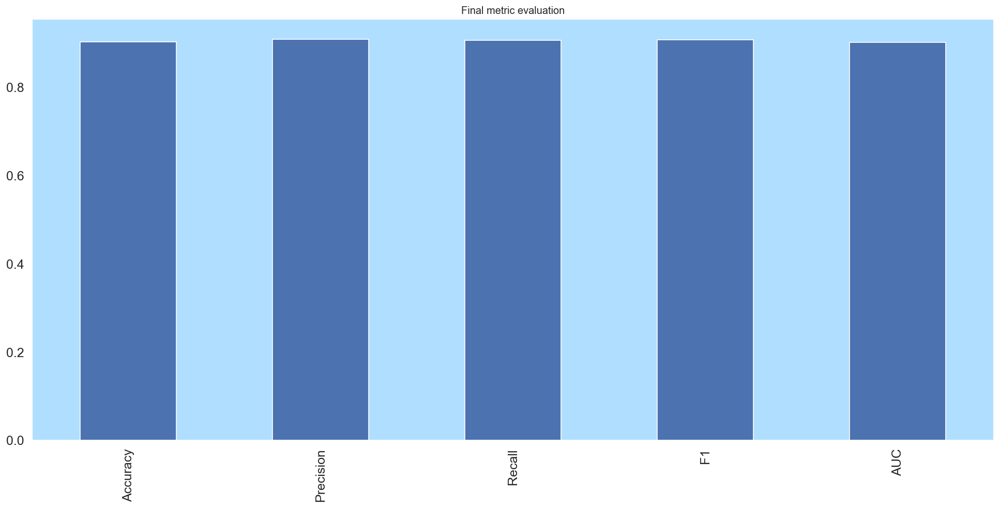

In [68]:
final_metrics={'Accuracy': scv.score(X_test,Y_test),
                   'Precision': precision_score(Y_test,scv_Y_pred),
                   'Recall': recall_score(Y_test,scv_Y_pred),
                   'F1': f1_score(Y_test,scv_Y_pred),
                   'AUC': roc_auc_score(Y_test,scv_Y_pred)}

metrics=pd.DataFrame(final_metrics,index=[0])

metrics.T.plot.bar(title='Final metric evaluation',legend=False);

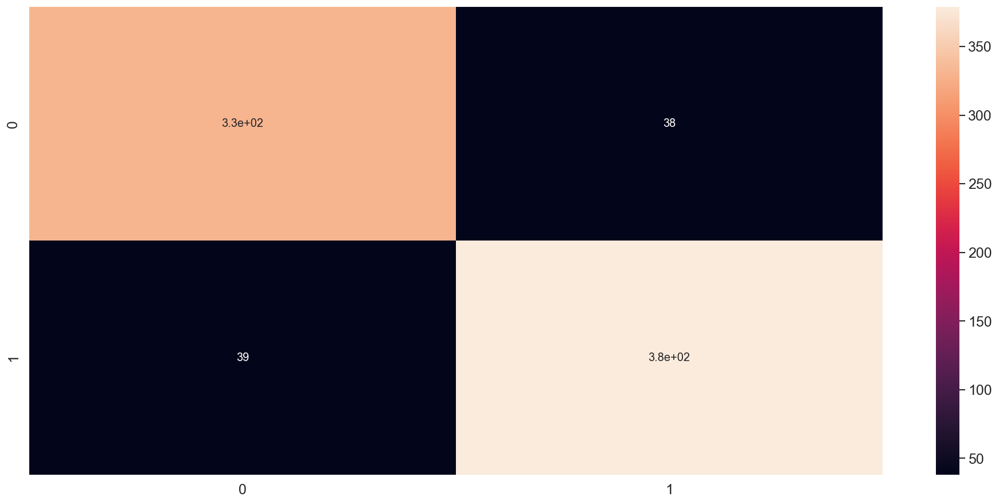

In [69]:
from sklearn.metrics import confusion_matrix

fig,ax=plt.subplots()
ax=sns.heatmap(confusion_matrix(Y_test,Knn_Y_pred),annot=True,cbar=True);

In [70]:
print("AGE, SEX, CHESTPAIN, RESTBP, CHOLES, FASTBS, RESTECG, MAXHR, EXAGINA, OLDPEAK, STSLOPE")
user_input=input("Enter the values one by one ")
user_input=user_input.split(",")


for i in range(len(user_input)):
    # convert each item to int type
    user_input[i] = float(user_input[i])

user_input=np.array(user_input)
user_input=user_input.reshape(1,-1)
user_input=scal.transform(user_input) #Test data
scv_Y_pred=scv.predict(user_input)
if(scv_Y_pred[0]==0):
    print("\nYou are healthy and are less likely to get a heart disease!")
else:
    print("\nWarning! You have chances of getting a heart disease!")

AGE, SEX, CHESTPAIN, RESTBP, CHOLES, FASTBS, RESTECG, MAXHR, EXAGINA, OLDPEAK, STSLOPE
Enter the values one by one 63,1,3,145,233,1,0,150,0,2.3,0

Warning! You have chances of getting a heart disease!


In [71]:
import pickle as pkl
pkl.dump(scv,open("final_model.p","wb"))

pkl.dump(RF_clf, open("final_rf_model.p","wb"))

In [72]:
model=pkl.load(open("final_model.p","rb"))
result = model.score(X_test, Y_test)

modelrf=pkl.load(open("final_rf_model.p","rb"))
resultrf = modelrf.score(X_test, Y_test)

model_comp = pd.DataFrame({'Model': ['SCV','Random Forest'], 'Accuracy': [result*100,resultrf*100]})
model_comp

,Model,Accuracy
0,SCV,90.216010
1,Random Forest,97.331639


In [73]:
user_input=input("Enter the values one by one ")
user_input=user_input.split(",")


for i in range(len(user_input)):
    # convert each item to int type
    user_input[i] = float(user_input[i])

user_input=np.array(user_input)
user_input=user_input.reshape(1,-1)
user_input=scal.transform(user_input)
predic=model.predict(user_input)
if(predic[0]==0):
    print("You are healthy and are less likely to get a heart disease!")
else:
    print("Warning! You have chances of getting a heart disease!")

Enter the values one by one 63,1,3,145,233,1,0,150,0,2.3,0
Warning! You have chances of getting a heart disease!


In [74]:
user_input=input("Enter the values one by one ")
user_input=user_input.split(",")


for i in range(len(user_input)):
    # convert each item to int type
    user_input[i] = float(user_input[i])

user_input=np.array(user_input)
user_input=user_input.reshape(1,-1)
user_input=scal.transform(user_input)
predicrf=modelrf.predict(user_input)
if(predicrf[0]==0):
    print("You are healthy and are less likely to get a heart disease!")
else:
    print("Warning! You have chances of getting a heart disease!")

Enter the values one by one 63,1,3,145,233,1,0,150,0,2.3,0
Warning! You have chances of getting a heart disease!


In [75]:
import sklearn
sklearn_version = sklearn.__version__
print(sklearn_version)

0.24.2


In [76]:
!pip install streamlit
!pip install pyngrok===4.1.1
from pyngrok import ngrok

In [77]:
%%writefile healthy-heart-app.py
import streamlit as st
import base64
import sklearn
import numpy as np
import pickle as pkl
from sklearn.preprocessing import MinMaxScaler
scal=MinMaxScaler()
#Load the saved model
model=pkl.load(open("final_model.p","rb"))

#Title Page
st.set_page_config(page_title="Heart Disease Prediction App",page_icon="⚕️",layout="centered",initial_sidebar_state="expanded")

#function
def preprocess(age,sex,chestpain,restbp,choles,fastbs,restecg,maxhr,exagina,oldpeak,stslope):   
 
    # Pre-processing user input   
    
    #SEX
    if sex=="Male":
        sex=1 
    else: 
        sex=0
    
    #CHEST PAIN
    if chestpain=="Typical Angina":
        chestpain=0
    elif chestpain=="Atypical Angina":
        chestpain=1
    elif chestpain=="Non-Anginal Pain":
        chestpain=2
    elif chestpain=="Asymptomatic":
        chestpain=3
    
    #EXERCISE AGINE
    if exagina=="Yes":
        exagina=1
    elif exagina=="No":
        exagina=0
 
    #FASTING BLOOD SUGAR
    if fastbs=="Yes":
        fastbs=1
    elif fastbs=="No":
        fastbs=0
 
    #ST SLOPE
    if stslope=="Upsloping: better heart rate with excercise(uncommon)":
        stslope=0
    elif stslope=="Flatsloping: minimal change(typical healthy heart)":
          stslope=1
    elif stslope=="Downsloping: signs of unhealthy heart":
        stslope=2  

    #RESTING ECG
    if restecg=="Nothing to note":
        restecg=0
    elif restecg=="ST-T Wave abnormality":
        restecg=1
    elif restecg=="Possible or definite left ventricular hypertrophy":
        restecg=2


    user_input=[age,sex,chestpain,restbp,choles,fastbs,restecg,maxhr,exagina,oldpeak,stslope]
    user_input=np.array(user_input)
    user_input=user_input.reshape(1,-1)
    #user_input=scal.fit_transform(user_input) # training data
    prediction = model.predict(user_input) 

    return prediction

    

       
    # front end elements of the web page 
html_temp = """ 
    <div style ="background-color:pink;padding:13px"> 
    <h1 style ="color:black;text-align:center;">Healthy Heart App</h1> 
    </div> 
    """
    
    # Display front end aspect
st.markdown(html_temp, unsafe_allow_html = True) 
st.subheader('by TARC Liaw Jing Shiong & Phoon Wen Hao ')
      
      
    # following lines create boxes in which user can enter data required to make prediction
    
    # Age (Drop Down)
age=st.selectbox ("Age",range(1,101,1))
    
    # Gender (Radio Button)
sex = st.radio("Select Gender: ", ('Male', 'Female'))
    
    # CHEST PAIN (Drop Down)
chestpain = st.selectbox('Chest Pain Type',("Typical Angina","Atypical Angina","Non-Anginal Pain","Asymptomatic")) 
    
    # RESTING BLOOD PRESSURE (Drop Down)
restbp = st.selectbox('Resting Blood Sugar',range(1,500,1))
    
    #CHOLESTEROL (Drop Down)
choles = st.selectbox('Serum Cholestoral in mg/dl',range(1,1000,1))
    
    # FASTING BLOOD SUGAR (Radio Button)
fastbs = st.radio("Fasting Blood Sugar higher than 120 mg/dl", ['Yes','No'])
    
    # RESTING ECG (Drop Down)
restecg = st.selectbox('Resting Electrocardiographic Results',("Nothing to note","ST-T Wave abnormality","Possible or definite left ventricular hypertrophy"))
    
    # MAXIMUM HEART RATE (Drop Down)
maxhr = st.selectbox('Maximum Heart Rate Achieved',range(1,300,1))
    
    # EXERCISE ANGINA (Drop Down)
exagina = st.selectbox('Exercise Induced Angina',["Yes","No"])
    
    # OLD PEAK (INPUT BOX)
oldpeak = st.number_input('Oldpeak')
    
    # ST SLOPE (Drop Down)
stslope = st.selectbox('Heart Rate Slope',("Upsloping: better heart rate with excercise(uncommon)","Flatsloping: minimal change(typical healthy heart)","Downsloping: signs of unhealthy heart"))

#user_input=preprocess(sex,cp,exang, fbs, slope, thal )
pred = preprocess(age,sex,chestpain,restbp,choles,fastbs,restecg,maxhr,exagina,oldpeak,stslope)
    

if st.button("Predict"):
    
    if pred[0] == 0:
        st.success('You have lower risk of getting a heart disease!')
    else:
        st.error('Warning! You have high risk of getting a heart attack!')
    
    # FEEDBACK
st.sidebar.subheader("About App")

st.sidebar.info("This web app is helps you to find out whether you are at a risk of developing a heart disease.")
st.sidebar.info("Enter the required fields and click on the 'Predict' button to check whether you have a healthy heart")
st.sidebar.info("Don't forget to rate this app")

feedback = st.sidebar.slider('How muchh would you rate this app?',min_value=0,max_value=5,step=1)

if feedback:
    st.header("Thank you for rating the app!")
    st.info("Caution: This is just a prediction and not doctoral advice. Kindly see a doctor if you feel the symptoms persist.") 


     

Overwriting healthy-heart-app.py


In [78]:
import streamlit as st
import base64
import sklearn
import numpy as np
import pickle as pkl
from sklearn.preprocessing import MinMaxScaler
scal=MinMaxScaler()
#Load the saved model
model=pkl.load(open("final_rf_model.p","rb"))
#function
def preprocess(age,sex,chestpain,restbp,choles,fastbs,restecg,maxhr,exagina,oldpeak,stslope):
 



    user_input=[age,sex,chestpain,restbp,choles,fastbs,restecg,maxhr,exagina,oldpeak,stslope]
    print(user_input)
    user_input=np.array(user_input)
    print(user_input)
    user_input=user_input.reshape(1,-1)
    print(user_input)
    #user_input=scal.fit_transform(user_input) # training data
    prediction = model.predict(user_input) 
    print(user_input)
    return prediction

prep = preprocess(63,1,3,145,233,1,0,150,0,2.3,0)
print(prep)


if prep == 0:
    print('You have lower risk of getting a heart disease!')
else:
    print('Warning! You have high risk of getting a heart attack!')

[40, 1, 1, 140, 289, 0, 0, 172, 0, 0, 0]
[ 40   1   1 140 289   0   0 172   0   0   0]
[[ 40   1   1 140 289   0   0 172   0   0   0]]
[[ 40   1   1 140 289   0   0 172   0   0   0]]
[0]
You have lower risk of getting a heart disease!


In [79]:
!nohup streamlit run healthy-heart-app.py &
url = ngrok.connect(port='8501')
url

OSError: Background processes not supported.